In [1]:
#all imports for the notebook
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import scipy.stats as stats

from kaggle.api.kaggle_api_extended import KaggleApi
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
from scipy.stats import levene
from scipy.stats import skew, kurtosis
from scipy.stats import kruskal, friedmanchisquare
from termcolor import colored

In [2]:
#download DB from kaggle of ESPN football mathces records
api = KaggleApi()
api.authenticate()



# Define dataset and destination
dataset_url = 'excel4soccer/espn-soccer-data/'
download_path = 'datasets/espn-soccer-data'  # Specify destination folder

# Download dataset
api.dataset_download_files(dataset_url, path=download_path, unzip=True)

print(f"Dataset downloaded to: {os.path.abspath(download_path)}")

Dataset URL: https://www.kaggle.com/datasets/excel4soccer/espn-soccer-data/versions/
Dataset downloaded to: c:\Projects\EDA\datasets\espn-soccer-data


Start merge CSVs and cleaning data

In [3]:
#handle the multiple csv file into one csv with column name change where duplicate


# Directory containing CSV files
csv_directory = r'datasets\espn-soccer-data\base_data'

# List all CSV files in the directory
csv_files = [f for f in os.listdir(csv_directory) if f.endswith('.csv')]
print(csv_files)

# Read the CSV files and create a variable for each DataFrame
for file in csv_files:
    # Read the CSV file into a DataFrame
    df = pd.read_csv(os.path.join(csv_directory, file))

    # Create a variable dynamically with the file name (without the extension)
    var_name = f"df_{file.split('.')[0]}"  # Remove file extension and prepend 'df_'
    globals()[var_name] = df  # Create a variable with the name var_name and assign the DataFrame

    print(f"Created variable: {var_name}") #test to see all files names correct
    #print(globals()[var_name].head())  # Display the first few rows of the DataFrame


#merge the files
df_leagues = df_leagues.drop(columns=['seasonName'])
merge_df_0 = pd.merge(df_fixtures, df_leagues, how='left', on=['seasonType', 'leagueId'])
df_status = df_status.rename(columns={'name' : 'status_name'})
merge_df_1 = pd.merge(merge_df_0, df_status, how='left', on=['statusId'])
merge_df_1 = merge_df_1[
    (merge_df_1['state'] == 'post') &
    (merge_df_1['status_name'].str.contains(r'FULL|FINAL', case=False, na=False))
]
df_teamStats = df_teamStats.drop(columns=['updateTime'])
merge_df_2 = pd.merge(merge_df_1, df_teamStats, how='left', on=['seasonType' , 'eventId'])
df_teams = df_teams.drop(columns=['venueId'])
df_teams = df_teams.rename(columns={'name' : 'team_name', 'slug' : 'slug_team', 'displayName' : 'displayName_team'})
merge_df_3 = pd.merge(merge_df_2, df_teams, how='left', on=['teamId'])
df_venues = df_venues.rename(columns={'fullName' : 'venue_fullName', 'shortName' : 'venue_shortName'})
df_final = pd.merge(merge_df_3, df_venues, how='left', on=['venueId'])


['fixtures.csv', 'keyEventDescription.csv', 'leagues.csv', 'players.csv', 'standings.csv', 'status.csv', 'teamRoster.csv', 'teams.csv', 'teamStats.csv', 'venues.csv']
Created variable: df_fixtures
Created variable: df_keyEventDescription
Created variable: df_leagues


C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\4191586706.py:14: DtypeWarning: Columns (2,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(csv_directory, file))


Created variable: df_players
Created variable: df_standings
Created variable: df_status
Created variable: df_teamRoster
Created variable: df_teams
Created variable: df_teamStats
Created variable: df_venues


In [4]:
# Set pandas display options to see all my features in output and all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', 1000)       # Increase the display width
pd.set_option('display.max_rows', 300)  # Show 300 rows
pd.set_option('display.max_colwidth', None)  # Show full column content

In [5]:
display(df_final.shape)
display(df_final)


(47647, 69)

,Rn,seasonType,leagueId,eventId,date,venueId,attendance,homeTeamId,awayTeamId,homeTeamWinner,awayTeamWinner,homeTeamScore,awayTeamScore,homeTeamShootoutScore,awayTeamShootoutScore,statusId,updateTime,year,seasonSlug,midsizeName,leagueName,leagueShortName,status_name,state,description,teamId,teamOrder,possessionPct,foulsCommitted,yellowCards,redCards,offsides,wonCorners,saves,totalShots,shotsOnTarget,shotPct,penaltyKickGoals,penaltyKickShots,accuratePasses,totalPasses,passPct,accurateCrosses,totalCrosses,crossPct,totalLongBalls,accurateLongBalls,longballPct,blockedShots,effectiveTackles,totalTackles,tacklePct,interceptions,effectiveClearance,totalClearance,location,team_name,abbreviation,displayName_team,shortDisplayName,color,alternateColor,logoURL,slug_team,venue_fullName,venue_shortName,capacity,city,country
0,1,12136,3922,689519,2024-01-01 05:00:00,8680,61916,627,4396,True,False,5,0,0,0,28,2024-01-07 03:20:23,2024.0,2024-international-friendly,FIFA.FRIENDLY,International Friendly,Men's International Friendly,STATUS_FULL_TIME,post,Full Time,627.0,0.0,58.9,7.0,0.0,0.0,1.0,13.0,1.0,30.0,10.0,0.3,0.0,0.0,489.0,594.0,0.8,13.0,31.0,0.4,43.0,27.0,0.6,10.0,9.0,16.0,0.6,22.0,10.0,10.0,Japan,Japan,JPN,Japan,Japan,ed1c24,ffffff,https://a.espncdn.com/i/teamlogos/countries/500/jpn.png,jpn,New Japan National Stadium,New Japan National Stadium,0.0,Tokyo,Japan
1,1,12136,3922,689519,2024-01-01 05:00:00,8680,61916,627,4396,True,False,5,0,0,0,28,2024-01-07 03:20:23,2024.0,2024-international-friendly,FIFA.FRIENDLY,International Friendly,Men's International Friendly,STATUS_FULL_TIME,post,Full Time,4396.0,1.0,41.1,6.0,2.0,0.0,1.0,3.0,6.0,8.0,1.0,0.1,0.0,0.0,319.0,428.0,0.7,0.0,9.0,0.0,63.0,19.0,0.3,3.0,12.0,16.0,0.8,12.0,37.0,37.0,Thailand,Thailand,THA,Thailand,Thailand,273476,dd2c33,https://a.espncdn.com/i/teamlogos/countries/500/tha.png,tha,New Japan National Stadium,New Japan National Stadium,0.0,Tokyo,Japan
2,2,12136,3922,694555,2024-01-01 13:30:00,4775,0,658,1928,False,True,1,2,0,0,28,2024-01-07 03:20:24,2024.0,2024-international-friendly,FIFA.FRIENDLY,International Friendly,Men's International Friendly,STATUS_FULL_TIME,post,Full Time,658.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,China,China,CHN,China,China,dd342c,ffe533,https://a.espncdn.com/i/teamlogos/countries/500/chn.png,chn,Baniyas stadium,Baniyas stadium,0.0,Abu Dhabi,United Arab Emirates
3,2,12136,3922,694555,2024-01-01 13:30:00,4775,0,658,1928,False,True,1,2,0,0,28,2024-01-07 03:20:24,2024.0,2024-international-friendly,FIFA.FRIENDLY,International Friendly,Men's International Friendly,STATUS_FULL_TIME,post,Full Time,1928.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Hong Kong,Hong Kong,HKG,Hong Kong,Hong Kong,E70000,FFFFFF,https://a.espncdn.com/i/teamlogos/countries/500/hkg.png,hkg,Baniyas stadium,Baniyas stadium,0.0,Abu Dhabi,United Arab Emirates
4,3,12136,3922,693431,2024-01-02 13:00:00,7614,0,4895,2621,False,True,0,4,0,0,28,2024-01-07 03:20:59,2024.0,2024-international-friendly,FIFA.FRIENDLY,International Friendly,Men's International Friendly,STATUS_FULL_TIME,post,Full Time,4895.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Indonesia,Indonesia,IDN,Indonesia,Indonesia,E70000,FFFFFF,https://a.espncdn.com/i/teamlogos/countries/500/idn.png,idn,Mardan Stadyumu,Mardan Stadyumu,0.0,Antalya,Turkey
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47642,10,13146,10751,727894,2025-01-18 15:15:00,1557,0,506,12934,False,False,2,2,0,0,28,2025-01-19 05:16:58,2024.0,closing-round,MLT.1,Maltese Premier League,Maltese Premier League,STATUS_FULL_TIME,post,

In [6]:
#analyse the raw data - most important are the stats parameter of each team on each fixture

#found missing data on massive rows which not exist in CSVs for all fixtures
#will take one stat columns called 'passPct' - need to drop all rows that not contain valid value ( 0<value<1)

# Drop rows where not 0 < passPct < 1 and reset the index
df_final = df_final[(df_final['passPct'] > 0) & (df_final['passPct'] < 1)].reset_index(drop=True)


#remove all friendly mathces which not used for stats + NULL league name that cant categorise
df_final = df_final[
    ~df_final['leagueName'].str.contains(r'friend', case=False, na=False) & 
    df_final['leagueName'].notna() & 
    df_final['leagueName'].str.strip().ne("")
].reset_index(drop=True)

# Replace values in 'teamOrder' column
df_final['teamOrder'] = df_final['teamOrder'].replace({0: 'Home', 1: 'Away'})

# Remove rows where 'status_name' does not contain 'FULL' or 'FINAL' (case-insensitive)
df_final = df_final[df_final['status_name'].str.contains('FULL|FINAL', case=False, na=False)]
# Reset the index
df_final = df_final.reset_index(drop=True)



display(df_final.shape)
display(df_final)

(12604, 69)

,Rn,seasonType,leagueId,eventId,date,venueId,attendance,homeTeamId,awayTeamId,homeTeamWinner,awayTeamWinner,homeTeamScore,awayTeamScore,homeTeamShootoutScore,awayTeamShootoutScore,statusId,updateTime,year,seasonSlug,midsizeName,leagueName,leagueShortName,status_name,state,description,teamId,teamOrder,possessionPct,foulsCommitted,yellowCards,redCards,offsides,wonCorners,saves,totalShots,shotsOnTarget,shotPct,penaltyKickGoals,penaltyKickShots,accuratePasses,totalPasses,passPct,accurateCrosses,totalCrosses,crossPct,totalLongBalls,accurateLongBalls,longballPct,blockedShots,effectiveTackles,totalTackles,tacklePct,interceptions,effectiveClearance,totalClearance,location,team_name,abbreviation,displayName_team,shortDisplayName,color,alternateColor,logoURL,slug_team,venue_fullName,venue_shortName,capacity,city,country
0,1,12225,2265,700802,2024-03-30 20:00:00,5120,43778,6087,819,False,True,0,3,0,0,28,2024-03-31 02:45:52,2024.0,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,6087.0,Home,38.5,6.0,2.0,0.0,2.0,4.0,6.0,11.0,5.0,0.5,0.0,0.0,332.0,387.0,0.9,4.0,11.0,0.4,50.0,28.0,0.6,2.0,14.0,22.0,0.6,2.0,30.0,30.0,Nova Iguaçu,Nova Iguaçu,NOV,Nova Iguaçu,Nova Iguaçu,fc7e01,000000,https://a.espncdn.com/i/teamlogos/soccer/500/6087.png,bra.nova_iguacu,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil
1,1,12225,2265,700802,2024-03-30 20:00:00,5120,43778,6087,819,False,True,0,3,0,0,28,2024-03-31 02:45:52,2024.0,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,819.0,Away,61.5,11.0,2.0,0.0,2.0,9.0,5.0,24.0,7.0,0.3,1.0,1.0,545.0,606.0,0.9,5.0,24.0,0.2,51.0,36.0,0.7,7.0,16.0,23.0,0.7,9.0,4.0,4.0,Flamengo,Flamengo,FLA,Flamengo,Flamengo,C60000,000000,https://a.espncdn.com/i/teamlogos/soccer/500/819.png,bra.flamengo,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil
2,2,12225,2265,700803,2024-04-07 20:00:00,5120,60490,819,6087,True,False,1,0,0,0,28,2024-03-31 02:54:58,2024.0,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,819.0,Home,57.8,14.0,2.0,0.0,0.0,10.0,3.0,14.0,6.0,0.4,0.0,0.0,488.0,551.0,0.9,6.0,19.0,0.3,48.0,32.0,0.7,3.0,14.0,22.0,0.6,6.0,6.0,6.0,Flamengo,Flamengo,FLA,Flamengo,Flamengo,C60000,000000,https://a.espncdn.com/i/teamlogos/soccer/500/819.png,bra.flamengo,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil
3,2,12225,2265,700803,2024-04-07 20:00:00,5120,60490,819,6087,True,False,1,0,0,0,28,2024-03-31 02:54:58,2024.0,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,6087.0,Away,42.2,10.0,3.0,0.0,1.0,2.0,4.0,12.0,3.0,0.3,0.0,0.0,361.0,413.0,0.9,0.0,4.0,0.0,41.0,21.0,0.5,2.0,16.0,26.0,0.6,8.0,22.0,22.0,Nova Iguaçu,Nova Iguaçu,NOV,Nova Iguaçu,Nova Iguaçu,fc7e01,000000,https://a.espncdn.com/i/teamlogos/soccer/500/6087.png,bra.nova_iguacu,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil
4,1,12226,2265,699730,2024-03-10 00:00:00,5120,52169,3445,819,False,True,0,2,0,0,28,2024-03-13 02:44:47,2024.0,carioca-championship---semifinals,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,3445.0,Home,51.0,10.0,3.0,1.0,2.0,3.0,8.0,8.0,0.0,0.0,0.0,0.0,354.0,412.0,0.9,2.0,13.0,0.2,44.0,25.0,0.6,2.0,13.0,19.0,0.7,7.0,26.0,26.0,Fluminense,Fluminense,FLU,Fluminense,Fluminense,7E0202,417505,https://a.espncdn.com/i/teamlogos/soccer/500/3445.png,bra.fluminense_fc,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12599,30,13016,3952,724049,2024-12-22 16:30:00,10203,0,10683,6732,Fals

In [7]:
#based on date column create new columns for month, season,day type

# Convert 'date' column to datetime
if 'date' in df_final.columns:
    df_final['date'] = pd.to_datetime(df_final['date'],
                                      errors='coerce')  # Convert to datetime, handle errors gracefully

    # Create new columns for time segments
    df_final['month'] = df_final['date'].dt.month  # Month of the year

    # Define seasons
    def get_season(month):
        if month in [12, 1, 2]:
            return 'Winter'
        elif month in [3, 4, 5]:
            return 'Spring'
        elif month in [6, 7, 8]:
            return 'Summer'
        elif month in [9, 10, 11]:
            return 'Fall'



    df_final['season'] = df_final['date'].dt.month.apply(get_season)  # Assign season based on the month

    # Create a new column for weekday or weekend
    df_final['day_type'] = df_final['date'].dt.dayofweek.apply(lambda x: 'Weekend' if x >= 4 else 'Weekday')


display(df_final.shape)
display(df_final)


(12604, 72)

,Rn,seasonType,leagueId,eventId,date,venueId,attendance,homeTeamId,awayTeamId,homeTeamWinner,awayTeamWinner,homeTeamScore,awayTeamScore,homeTeamShootoutScore,awayTeamShootoutScore,statusId,updateTime,year,seasonSlug,midsizeName,leagueName,leagueShortName,status_name,state,description,teamId,teamOrder,possessionPct,foulsCommitted,yellowCards,redCards,offsides,wonCorners,saves,totalShots,shotsOnTarget,shotPct,penaltyKickGoals,penaltyKickShots,accuratePasses,totalPasses,passPct,accurateCrosses,totalCrosses,crossPct,totalLongBalls,accurateLongBalls,longballPct,blockedShots,effectiveTackles,totalTackles,tacklePct,interceptions,effectiveClearance,totalClearance,location,team_name,abbreviation,displayName_team,shortDisplayName,color,alternateColor,logoURL,slug_team,venue_fullName,venue_shortName,capacity,city,country,month,season,day_type
0,1,12225,2265,700802,2024-03-30 20:00:00,5120,43778,6087,819,False,True,0,3,0,0,28,2024-03-31 02:45:52,2024.0,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,6087.0,Home,38.5,6.0,2.0,0.0,2.0,4.0,6.0,11.0,5.0,0.5,0.0,0.0,332.0,387.0,0.9,4.0,11.0,0.4,50.0,28.0,0.6,2.0,14.0,22.0,0.6,2.0,30.0,30.0,Nova Iguaçu,Nova Iguaçu,NOV,Nova Iguaçu,Nova Iguaçu,fc7e01,000000,https://a.espncdn.com/i/teamlogos/soccer/500/6087.png,bra.nova_iguacu,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil,3,Spring,Weekend
1,1,12225,2265,700802,2024-03-30 20:00:00,5120,43778,6087,819,False,True,0,3,0,0,28,2024-03-31 02:45:52,2024.0,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,819.0,Away,61.5,11.0,2.0,0.0,2.0,9.0,5.0,24.0,7.0,0.3,1.0,1.0,545.0,606.0,0.9,5.0,24.0,0.2,51.0,36.0,0.7,7.0,16.0,23.0,0.7,9.0,4.0,4.0,Flamengo,Flamengo,FLA,Flamengo,Flamengo,C60000,000000,https://a.espncdn.com/i/teamlogos/soccer/500/819.png,bra.flamengo,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil,3,Spring,Weekend
2,2,12225,2265,700803,2024-04-07 20:00:00,5120,60490,819,6087,True,False,1,0,0,0,28,2024-03-31 02:54:58,2024.0,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,819.0,Home,57.8,14.0,2.0,0.0,0.0,10.0,3.0,14.0,6.0,0.4,0.0,0.0,488.0,551.0,0.9,6.0,19.0,0.3,48.0,32.0,0.7,3.0,14.0,22.0,0.6,6.0,6.0,6.0,Flamengo,Flamengo,FLA,Flamengo,Flamengo,C60000,000000,https://a.espncdn.com/i/teamlogos/soccer/500/819.png,bra.flamengo,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil,4,Spring,Weekend
3,2,12225,2265,700803,2024-04-07 20:00:00,5120,60490,819,6087,True,False,1,0,0,0,28,2024-03-31 02:54:58,2024.0,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,6087.0,Away,42.2,10.0,3.0,0.0,1.0,2.0,4.0,12.0,3.0,0.3,0.0,0.0,361.0,413.0,0.9,0.0,4.0,0.0,41.0,21.0,0.5,2.0,16.0,26.0,0.6,8.0,22.0,22.0,Nova Iguaçu,Nova Iguaçu,NOV,Nova Iguaçu,Nova Iguaçu,fc7e01,000000,https://a.espncdn.com/i/teamlogos/soccer/500/6087.png,bra.nova_iguacu,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil,4,Spring,Weekend
4,1,12226,2265,699730,2024-03-10 00:00:00,5120,52169,3445,819,False,True,0,2,0,0,28,2024-03-13 02:44:47,2024.0,carioca-championship---semifinals,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,post,Full Time,3445.0,Home,51.0,10.0,3.0,1.0,2.0,3.0,8.0,8.0,0.0,0.0,0.0,0.0,354.0,412.0,0.9,2.0,13.0,0.2,44.0,25.0,0.6,2.0,13.0,19.0,0.7,7.0,26.0,26.0,Fluminense,Fluminense,FLU,Fluminense,Fluminense,7E0202,417505,https://a.espncdn.com/i/teamlogos/soccer/500/3445.png,bra.fluminense_fc,Estadio do Maracanã,Estadio do Maracanã,0.0,Rio de Janeiro,Brazil,3,Spring,Weekend
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

Feature filtering

In [8]:
#find columns with more than threshold null

# Define the missing threshold %of NaN in the column
threshold_null = 0.2  # If missing values above this limit, the column will be deleted

# Identify columns with more than % NaN values and append to columns_to_drop
threshold = int(threshold_null * len(df_final))
columns_to_drop = df_final.columns[df_final.isnull().sum() > threshold]
print(f"remove columns with NULL: {columns_to_drop}")
if columns_to_drop.size >0:
    df_final = df_final.drop(columns=columns_to_drop)

remove columns with NULL: Index([], dtype='object')


In [9]:
# Identify columns where all data is the same (constant)
columns_to_drop = df_final.columns[df_final.nunique() == 1]
print(f"remove columns with same data: {columns_to_drop}")
if columns_to_drop.size>0:
    df_final = df_final.drop(columns=columns_to_drop)

remove columns with same data: Index(['year', 'state', 'capacity'], dtype='object')


In [10]:
# Check for duplicate columns by values - if there is identical columns data drop the 2nd as they are dependens
# Identify duplicate columns by values
columns_to_drop = set()  # To store only the second column in duplicate pairs
columns_to_check = df_final.columns.tolist()

for i in range(len(columns_to_check)):
    for j in range(i + 1, len(columns_to_check)):  # Compare each column only with subsequent columns
        col1, col2 = columns_to_check[i], columns_to_check[j]
        if col2 not in columns_to_drop:  # Ensure col2 isn't already marked as a duplicate
            if df_final[col1].equals(df_final[col2]):  # Compare column values
                columns_to_drop.add(col2)  # Add only col2 (the duplicate) to the set
                print(f"Duplicate column found: {col2} (same as {col1})")


# Add duplicate columns to the columns_to_drop list
print(f"remove duplicate columns: {columns_to_drop}")

if len(columns_to_drop)>0:
    df_final = df_final.drop(columns=columns_to_drop)

Duplicate column found: totalClearance (same as effectiveClearance)
Duplicate column found: team_name (same as location)
Duplicate column found: displayName_team (same as location)
remove duplicate columns: {'displayName_team', 'totalClearance', 'team_name'}


In [11]:
columns_to_drop = []
threshold_frequency = 0.98  # 98%
for col in df_final.columns:
    most_frequent_value_count = df_final[col].value_counts(dropna=False).max()  # Count the most frequent value
    if most_frequent_value_count / len(df_final) >= threshold_frequency:  # Check if it exceeds 98%
        columns_to_drop.append(col)
# Add these columns to the columns_to_drop list
print(f"remove columns with high freq: {columns_to_drop}")

if len(columns_to_drop)>0:
    df_final = df_final.drop(columns=columns_to_drop)


remove columns with high freq: []


In [12]:
#how many empty / null per line


# Variable for percentage threshold
threshold_percent = 10

# Initialize a list to save columns that meet the criteria
columns_above_threshold = []

# Total rows in the DataFrame
print(f"Total rows: {df_final.shape[0]}\n")

# Iterate through each column
for column in df_final.columns:
    unique_count = df_final[column].nunique()  # Count of unique values
    null_count = df_final[column].isnull().sum()  # Count of null values
    empty_count = (df_final[column] == '').sum()  # Count of empty strings

    # Calculate percentages
    null_percent = (null_count / df_final.shape[0]) * 100
    empty_percent = (empty_count / df_final.shape[0]) * 100

    # Check if the column meets the threshold criteria
    if null_percent > threshold_percent or empty_percent > threshold_percent:
        # Add to list of columns that meet criteria
        columns_above_threshold.append(column)

        # Formatting and coloring for values > threshold_percent
        column_name_display = (
            f"\033[91m{column}\033[0m"  # Red for column name if threshold is exceeded
            if null_percent > threshold_percent or empty_percent > threshold_percent
            else column
        )
        null_percent_display = (
            f"\033[91m{null_percent:.2f}%\033[0m"  # Red if null % exceeds threshold
            if null_percent > threshold_percent
            else f"{null_percent:.2f}%"
        )
        empty_percent_display = (
            f"\033[91m{empty_percent:.2f}%\033[0m"  # Red if empty % exceeds threshold
            if empty_percent > threshold_percent
            else f"{empty_percent:.2f}%"
        )

        # Output for the column (only for those meeting the criteria)
        print(f"Column: {column_name_display}")
        print(f"  Unique values: {unique_count}")
        print(f"  Null values: {null_count} ({null_percent_display})")
        print(f"  Empty values: {empty_count} ({empty_percent_display})")
        print("-" * 40)

# Print the list of columns that meet the criteria
print(f"Columns that exceed {threshold_percent}% null or empty values: {columns_above_threshold}")




Total rows: 12604

Columns that exceed 10% null or empty values: []


In [13]:
#analyse columns to drop what not needed manually
display(df_final.shape)
display(df_final.dtypes)
display(df_final.info())
display(df_final.nunique())
display(df_final)

(12604, 66)

Rn                                int64
seasonType                        int64
leagueId                          int64
eventId                           int64
date                     datetime64[ns]
venueId                           int64
attendance                        int64
homeTeamId                        int64
awayTeamId                        int64
homeTeamWinner                     bool
awayTeamWinner                     bool
homeTeamScore                     int64
awayTeamScore                     int64
homeTeamShootoutScore             int64
awayTeamShootoutScore             int64
statusId                          int64
updateTime                       object
seasonSlug                       object
midsizeName                      object
leagueName                       object
leagueShortName                  object
status_name                      object
description                      object
teamId                          float64
teamOrder                        object


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12604 entries, 0 to 12603
Data columns (total 66 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Rn                     12604 non-null  int64         
 1   seasonType             12604 non-null  int64         
 2   leagueId               12604 non-null  int64         
 3   eventId                12604 non-null  int64         
 4   date                   12604 non-null  datetime64[ns]
 5   venueId                12604 non-null  int64         
 6   attendance             12604 non-null  int64         
 7   homeTeamId             12604 non-null  int64         
 8   awayTeamId             12604 non-null  int64         
 9   homeTeamWinner         12604 non-null  bool          
 10  awayTeamWinner         12604 non-null  bool          
 11  homeTeamScore          12604 non-null  int64         
 12  awayTeamScore          12604 non-null  int64         
 13  h

None

Rn                        493
seasonType                163
leagueId                   53
eventId                  6303
date                     3277
venueId                   830
attendance               4748
homeTeamId                881
awayTeamId                829
homeTeamWinner              2
awayTeamWinner              2
homeTeamScore              10
awayTeamScore               9
homeTeamShootoutScore      11
awayTeamShootoutScore      13
statusId                    3
updateTime               4860
seasonSlug                 65
midsizeName                53
leagueName                 53
leagueShortName            53
status_name                 3
description                 3
teamId                    995
teamOrder                   2
possessionPct             642
foulsCommitted             31
yellowCards                12
redCards                    4
offsides                   13
wonCorners                 22
saves                      18
totalShots                 43
shotsOnTar

,Rn,seasonType,leagueId,eventId,date,venueId,attendance,homeTeamId,awayTeamId,homeTeamWinner,awayTeamWinner,homeTeamScore,awayTeamScore,homeTeamShootoutScore,awayTeamShootoutScore,statusId,updateTime,seasonSlug,midsizeName,leagueName,leagueShortName,status_name,description,teamId,teamOrder,possessionPct,foulsCommitted,yellowCards,redCards,offsides,wonCorners,saves,totalShots,shotsOnTarget,shotPct,penaltyKickGoals,penaltyKickShots,accuratePasses,totalPasses,passPct,accurateCrosses,totalCrosses,crossPct,totalLongBalls,accurateLongBalls,longballPct,blockedShots,effectiveTackles,totalTackles,tacklePct,interceptions,effectiveClearance,location,abbreviation,shortDisplayName,color,alternateColor,logoURL,slug_team,venue_fullName,venue_shortName,city,country,month,season,day_type
0,1,12225,2265,700802,2024-03-30 20:00:00,5120,43778,6087,819,False,True,0,3,0,0,28,2024-03-31 02:45:52,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,Full Time,6087.0,Home,38.5,6.0,2.0,0.0,2.0,4.0,6.0,11.0,5.0,0.5,0.0,0.0,332.0,387.0,0.9,4.0,11.0,0.4,50.0,28.0,0.6,2.0,14.0,22.0,0.6,2.0,30.0,Nova Iguaçu,NOV,Nova Iguaçu,fc7e01,000000,https://a.espncdn.com/i/teamlogos/soccer/500/6087.png,bra.nova_iguacu,Estadio do Maracanã,Estadio do Maracanã,Rio de Janeiro,Brazil,3,Spring,Weekend
1,1,12225,2265,700802,2024-03-30 20:00:00,5120,43778,6087,819,False,True,0,3,0,0,28,2024-03-31 02:45:52,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,Full Time,819.0,Away,61.5,11.0,2.0,0.0,2.0,9.0,5.0,24.0,7.0,0.3,1.0,1.0,545.0,606.0,0.9,5.0,24.0,0.2,51.0,36.0,0.7,7.0,16.0,23.0,0.7,9.0,4.0,Flamengo,FLA,Flamengo,C60000,000000,https://a.espncdn.com/i/teamlogos/soccer/500/819.png,bra.flamengo,Estadio do Maracanã,Estadio do Maracanã,Rio de Janeiro,Brazil,3,Spring,Weekend
2,2,12225,2265,700803,2024-04-07 20:00:00,5120,60490,819,6087,True,False,1,0,0,0,28,2024-03-31 02:54:58,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,Full Time,819.0,Home,57.8,14.0,2.0,0.0,0.0,10.0,3.0,14.0,6.0,0.4,0.0,0.0,488.0,551.0,0.9,6.0,19.0,0.3,48.0,32.0,0.7,3.0,14.0,22.0,0.6,6.0,6.0,Flamengo,FLA,Flamengo,C60000,000000,https://a.espncdn.com/i/teamlogos/soccer/500/819.png,bra.flamengo,Estadio do Maracanã,Estadio do Maracanã,Rio de Janeiro,Brazil,4,Spring,Weekend
3,2,12225,2265,700803,2024-04-07 20:00:00,5120,60490,819,6087,True,False,1,0,0,0,28,2024-03-31 02:54:58,carioca-championship---final,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,Full Time,6087.0,Away,42.2,10.0,3.0,0.0,1.0,2.0,4.0,12.0,3.0,0.3,0.0,0.0,361.0,413.0,0.9,0.0,4.0,0.0,41.0,21.0,0.5,2.0,16.0,26.0,0.6,8.0,22.0,Nova Iguaçu,NOV,Nova Iguaçu,fc7e01,000000,https://a.espncdn.com/i/teamlogos/soccer/500/6087.png,bra.nova_iguacu,Estadio do Maracanã,Estadio do Maracanã,Rio de Janeiro,Brazil,4,Spring,Weekend
4,1,12226,2265,699730,2024-03-10 00:00:00,5120,52169,3445,819,False,True,0,2,0,0,28,2024-03-13 02:44:47,carioca-championship---semifinals,BRA.CAMP.CARIOCA,Brazilian Campeonato Carioca,Brazil Carioca,STATUS_FULL_TIME,Full Time,3445.0,Home,51.0,10.0,3.0,1.0,2.0,3.0,8.0,8.0,0.0,0.0,0.0,0.0,354.0,412.0,0.9,2.0,13.0,0.2,44.0,25.0,0.6,2.0,13.0,19.0,0.7,7.0,26.0,Fluminense,FLU,Fluminense,7E0202,417505,https://a.espncdn.com/i/teamlogos/soccer/500/3445.png,bra.fluminense_fc,Estadio do Maracanã,Estadio do Maracanã,Rio de Janeiro,Brazil,3,Spring,Weekend
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12599,30,13016,3952,724049,2024-12-22 16:30:00,10203,0,10683,6732,False,True,2,2,4,5,47,2024-12-23 05:25:02,round-of-64,FRA.COUPE_DE_FRANCE,Coupe de France,Coupe de France,STATUS_FINAL_PEN,Final Score - After Penalties,6732.0,Away,47.1,14.0,0.0,0

In [14]:
#manual columns drop per user data view above
columns_to_drop = ['Rn', 'seasonType', 'leagueId', 'eventId', 'date', 'venueId', 'homeTeamId', 'awayTeamId', 'statusId', 'updateTime', 'seasonSlug','midsizeName', 'leagueShortName', 'description',
                   'teamId', 'location', 'abbreviation', 'shortDisplayName', 'color', 'alternateColor', 'logoURL', 'slug_team',  'venue_fullName' , 'venue_shortName', 'city' , 'month' , 'country' ]

if len(columns_to_drop)>0:
    df_final = df_final.drop(columns=columns_to_drop)

display(df_final.shape)


(12604, 39)

In [15]:
# Save the cleaned dataframe to a new CSV file
df_final.to_csv('DB.csv', index=False)

In [16]:
#copy the df_final to df to have easier coding

df = df_final.copy()

Handle data type converting

In [17]:
display(df.dtypes)
display(df.nunique())

attendance                 int64
homeTeamWinner              bool
awayTeamWinner              bool
homeTeamScore              int64
awayTeamScore              int64
homeTeamShootoutScore      int64
awayTeamShootoutScore      int64
leagueName                object
status_name               object
teamOrder                 object
possessionPct            float64
foulsCommitted           float64
yellowCards              float64
redCards                 float64
offsides                 float64
wonCorners               float64
saves                    float64
totalShots               float64
shotsOnTarget            float64
shotPct                  float64
penaltyKickGoals         float64
penaltyKickShots         float64
accuratePasses           float64
totalPasses              float64
passPct                  float64
accurateCrosses          float64
totalCrosses             float64
crossPct                 float64
totalLongBalls           float64
accurateLongBalls        float64
longballPc

attendance               4748
homeTeamWinner              2
awayTeamWinner              2
homeTeamScore              10
awayTeamScore               9
homeTeamShootoutScore      11
awayTeamShootoutScore      13
leagueName                 53
status_name                 3
teamOrder                   2
possessionPct             642
foulsCommitted             31
yellowCards                12
redCards                    4
offsides                   13
wonCorners                 22
saves                      18
totalShots                 43
shotsOnTarget              21
shotPct                    11
penaltyKickGoals            4
penaltyKickShots            4
accuratePasses            689
totalPasses               689
passPct                     7
accurateCrosses            23
totalCrosses               63
crossPct                   10
totalLongBalls            109
accurateLongBalls          68
longballPct                11
blockedShots               19
effectiveTackles           33
totalTackl

In [18]:
#auto convert data types

df = df.convert_dtypes()

# Define the threshold for unique values
max_unique_values = 20

# Iterate through all string columns
for col in df.select_dtypes(include='string'):
    if df[col].nunique() <= max_unique_values:  # Only transform if unique values <= max_unique_values
        df[col] = df[col].astype('category')


#transform all numeric columns back to lower dtype pandas -> numpy in order to do stat calc use median if there is null/nan in numeric to fill

# Select only numerical columns
numerical_cols_clean = df.select_dtypes(include=['number']).columns

# Replace NaN and NULL values in numeric columns with the median of each column
for col in numerical_cols_clean:
    median_value = df[col].median()
    df[col] = df[col].fillna(median_value).replace('NULL', median_value)

# Convert to lowercase data type (pandas to numpy)
df = df.astype({col: str(df[col].dtype).lower() for col in df.columns})

# Convert bool to int64 data type and create new cat colmuns
for col in df.select_dtypes(include='bool'):
    # Create two new columns with '_cat' suffix by first converting boolean to string
    df[f'{col}_cat'] = df[col].map({True: 'YES', False: 'NO'})
    
    # Change the dtype of the new column to 'category'
    df[f'{col}_cat'] = df[f'{col}_cat'].astype('category')
    
    # Convert the original boolean column to int64
    df[col] = df[col].astype('int64')



display(df.dtypes)

attendance                        int64
homeTeamWinner                    int64
awayTeamWinner                    int64
homeTeamScore                     int64
awayTeamScore                     int64
homeTeamShootoutScore             int64
awayTeamShootoutScore             int64
leagueName               string[python]
status_name                    category
teamOrder                      category
possessionPct                   float64
foulsCommitted                    int64
yellowCards                       int64
redCards                          int64
offsides                          int64
wonCorners                        int64
saves                             int64
totalShots                        int64
shotsOnTarget                     int64
shotPct                         float64
penaltyKickGoals                  int64
penaltyKickShots                  int64
accuratePasses                    int64
totalPasses                       int64
passPct                         float64


In [19]:
# Validate no more null/nan

# Variable for percentage threshold
threshold_percent = 0.00000000000000000000001

# Initialize a list to save columns that meet the criteria
columns_above_threshold = []

# Total rows in the DataFrame
print(f"Total rows: {df.shape[0]}\n")

# Iterate through each column
for column in df.columns:
    unique_count = df[column].nunique()  # Count of unique values
    null_count = df[column].isnull().sum()  # Count of null values
    empty_count = (df[column] == '').sum()  # Count of empty strings

    # Calculate percentages
    null_percent = (null_count / df.shape[0]) * 100
    empty_percent = (empty_count / df.shape[0]) * 100

    # Check if the column meets the threshold criteria
    if null_percent > threshold_percent or empty_percent > threshold_percent:
        # Add to list of columns that meet criteria
        columns_above_threshold.append(column)

    # Get the dtype of the column
    column_dtype = df[column].dtype

    # Formatting and coloring for values > threshold_percent
    column_name_display = (
        f"\033[91m{column}\033[0m"  # Red for column name if threshold is exceeded
        if null_percent > threshold_percent or empty_percent > threshold_percent
        else column
    )
    null_percent_display = (
        f"\033[91m{null_percent:.2f}%\033[0m"  # Red if null % exceeds threshold
        if null_percent > threshold_percent
        else f"{null_percent:.2f}%"
    )
    empty_percent_display = (
        f"\033[91m{empty_percent:.2f}%\033[0m"  # Red if empty % exceeds threshold
        if empty_percent > threshold_percent
        else f"{empty_percent:.2f}%"
    )

    # Output for the column (only for those meeting the criteria)
    print(f"Column: {column_name_display} , {column_dtype}")
    print(f"  Unique values: {unique_count}")
    print(f"  Null values: {null_count} ({null_percent_display})")
    print(f"  Empty values: {empty_count} ({empty_percent_display})")
    print("-" * 40)

# Print the list of columns that meet the criteria
print(f"Columns that exceed {threshold_percent}% null or empty values: {columns_above_threshold}")

Total rows: 12604

Column: attendance , int64
  Unique values: 4748
  Null values: 0 (0.00%)
  Empty values: 0 (0.00%)
----------------------------------------
Column: homeTeamWinner , int64
  Unique values: 2
  Null values: 0 (0.00%)
  Empty values: 0 (0.00%)
----------------------------------------
Column: awayTeamWinner , int64
  Unique values: 2
  Null values: 0 (0.00%)
  Empty values: 0 (0.00%)
----------------------------------------
Column: homeTeamScore , int64
  Unique values: 10
  Null values: 0 (0.00%)
  Empty values: 0 (0.00%)
----------------------------------------
Column: awayTeamScore , int64
  Unique values: 9
  Null values: 0 (0.00%)
  Empty values: 0 (0.00%)
----------------------------------------
Column: homeTeamShootoutScore , int64
  Unique values: 11
  Null values: 0 (0.00%)
  Empty values: 0 (0.00%)
----------------------------------------
Column: awayTeamShootoutScore , int64
  Unique values: 13
  Null values: 0 (0.00%)
  Empty values: 0 (0.00%)
--------------

In [20]:
#save the modified final DB to csv

df.to_csv('DB_modified.csv', index=False)

FROM HERE START THE ANALYSIS AND STOP THE DATA BASE MODIFICATION AND CLEANUP

Hypotesis that want to check and validate:

1. there is difference in statistics between categories defined specially season/day_type/teamOrder
2. what is the HOME/AWAY chance to WIN based on all statistics bool vars
3. is the attendace amount affect the stats for each home/away

In [21]:
#get describe data basic stats - explored to see if need any data modificaiton
display(df.describe().T)

,count,mean,std,min,25%,50%,75%,max
attendance,12604.0,18555.650032,17518.750334,0.0,4058.0,15000.0,26600.0,217000.0
homeTeamWinner,12604.0,0.466915,0.498924,0.0,0.0,0.0,1.0,1.0
awayTeamWinner,12604.0,0.309188,0.462177,0.0,0.0,0.0,1.0,1.0
homeTeamScore,12604.0,1.512139,1.309126,0.0,1.0,1.0,2.0,9.0
awayTeamScore,12604.0,1.180181,1.175263,0.0,0.0,1.0,2.0,8.0
homeTeamShootoutScore,12604.0,0.083624,0.644920,0.0,0.0,0.0,0.0,16.0
awayTeamShootoutScore,12604.0,0.082196,0.636809,0.0,0.0,0.0,0.0,15.0
possessionPct,12604.0,50.005617,11.677578,14.6,41.7,50.0,58.3,90.9
foulsCommitted,12604.0,12.013567,4.009240,0.0,9.0,12.0,15.0,30.0
yellowCards,12604.0,2.154713,1.442002,0.0,1.0,2.0,3.0,11.0


In [22]:
# Own code for all basic stats - add till got final per desired outcome

# Create an empty DataFrame to hold stats
stats_df = pd.DataFrame()

# Identify categorical and numerical columns
categorical_cols = df.select_dtypes(include=['category']).columns
numerical_cols = df.select_dtypes(include=['number']).columns

# Calculate the frequency and percentage of the mode for numerical columns
mode_count = df[numerical_cols].apply(lambda x: x.value_counts().iloc[0] if len(x.value_counts()) > 0 else None)
mode_percentage = df[numerical_cols].apply(lambda x: (x.value_counts().iloc[0] / len(x)) * 100 if len(x.value_counts()) > 0 else None)


# For numerical columns, calculate the relevant statistics
stats_df['Min'] = df[numerical_cols].min()
stats_df['Max'] = df[numerical_cols].max()
stats_df['AVG'] = df[numerical_cols].mean()
stats_df['Median'] = df[numerical_cols].median()
stats_df['Range'] = df[numerical_cols].max() - df[numerical_cols].min()
stats_df['STD'] = df[numerical_cols].std()
stats_df['VAR'] = df[numerical_cols].var().apply(lambda x: f"{x:,.2f}")
stats_df['SUM'] = df[numerical_cols].sum().apply(lambda x: f"{x:,.2f}")
stats_df['Count'] = df[numerical_cols].count()
stats_df['Mode'] = df[numerical_cols].mode().iloc[0]
stats_df['Mode Count'] = mode_count
stats_df['Mode Percentage'] = mode_percentage
stats_df['5%'] = df[numerical_cols].quantile(0.05)
stats_df['Q1'] = df[numerical_cols].quantile(0.25)
stats_df['Q3'] = df[numerical_cols].quantile(0.75)
stats_df['95%'] = df[numerical_cols].quantile(0.95)
stats_df['IQR'] = df[numerical_cols].quantile(0.75) - df[numerical_cols].quantile(0.25)


# For categorical columns, calculate specific statistics
stats_categorical = pd.DataFrame()
stats_categorical['Mode'] = df[categorical_cols].mode().iloc[0]  # Mode (most frequent value)
stats_categorical['Count'] = df[categorical_cols].apply(lambda x: x.value_counts().iloc[0])  # Count of most frequent value
stats_categorical['Unique Count'] = df[categorical_cols].nunique()  # Count of unique values for categorical columns

# Calculate the frequency and percentage of the mode for categorical columns
mode_count_cat = df[categorical_cols].apply(lambda x: x.value_counts().iloc[0] if len(x.value_counts()) > 0 else None)
mode_percentage_cat = df[categorical_cols].apply(lambda x: (x.value_counts().iloc[0] / len(x)) * 100 if len(x.value_counts()) > 0 else None)

stats_categorical['Mode Count'] = mode_count_cat
stats_categorical['Mode Percentage'] = mode_percentage_cat

# Display the stats for numerical and categorical columns
stats_df, stats_categorical

(                        Min       Max           AVG   Median     Range           STD             VAR             SUM  Count   Mode  Mode Count  Mode Percentage     5%      Q1       Q3      95%      IQR
 attendance              0.0  217000.0  18555.650032  15000.0  217000.0  17518.750334  306,906,613.27  233,875,413.00  12604    0.0        1224         9.711203    0.0  4058.0  26600.0  55772.0  22542.0
 homeTeamWinner          0.0       1.0      0.466915      0.0       1.0      0.498924            0.25        5,885.00  12604    0.0        6719        53.308474    0.0     0.0      1.0      1.0      1.0
 awayTeamWinner          0.0       1.0      0.309188      0.0       1.0      0.462177            0.21        3,897.00  12604    0.0        8707        69.081244    0.0     0.0      1.0      1.0      1.0
 homeTeamScore           0.0       9.0      1.512139      1.0       9.0      1.309126            1.71       19,059.00  12604    1.0        4173        33.108537    0.0     1.0      2.0    

can see that have several features that have VAR and STD which very high we will see how its react later in the correlations and graphs

In [23]:
#outlier calc - looked for features with massive outlier precent and removed them

# Function to calculate Z-scores and detect outliers
def detect_outliers_zscore(df, numerical_cols):
    outlier_info = {}

    # Calculate Z-scores for each numerical column
    for col in numerical_cols:
        # Calculate mean and std of the column
        mean = df[col].mean()
        std = df[col].std()

        # Calculate Z-scores
        z_scores = (df[col] - mean) / std

        # Find outliers: Z-score > 3 or Z-score < -3
        outliers = df[(z_scores > 3) | (z_scores < -3)]
        
        # Store the outlier information for this column
        outlier_count = len(outliers)
        total_rows = len(df)
        outlier_percentage = (outlier_count / total_rows) * 100

        # Calculate statistical summaries for the outliers
        outliers_stats = {
            'Min': outliers[col].min() if outlier_count > 0 else None,
            'Max': outliers[col].max() if outlier_count > 0 else None,
            'Mean': outliers[col].mean() if outlier_count > 0 else None,
            'Median': outliers[col].median() if outlier_count > 0 else None
        }

        outlier_info[col] = {
            'Outlier Count': outlier_count,
            'Total Rows': total_rows,
            'Outlier Percentage': outlier_percentage,
            'Outlier Stats': outliers_stats
        }

    return outlier_info

numerical_cols = df.select_dtypes(include=['number']).columns  # Automatically selecting numerical columns
precent_failure = 5
# Detect outliers
outlier_info = detect_outliers_zscore(df, numerical_cols)

# Print the results for each column, highlighting the rows where outlier percentage > precent_failure
for col, info in outlier_info.items():
    outlier_percentage = info['Outlier Percentage']
    if outlier_percentage > precent_failure:  # Only print if there are outliers and percentage > precent_failure
        # Highlighting high outlier percentages
        print(colored(f"Feature: {col}", 'yellow', attrs=['bold']))
        print(colored(f"Outlier Count: {info['Outlier Count']}", 'cyan'))
        print(colored(f"Total Rows: {info['Total Rows']}", 'cyan'))
        print(colored(f"Outlier Percentage: {outlier_percentage:.2f}%", 'red', attrs=['bold']))
        print(colored(f"Outlier Min: {info['Outlier Stats']['Min']}", 'magenta'))
        print(colored(f"Outlier Max: {info['Outlier Stats']['Max']}", 'magenta'))
        print(colored(f"Outlier Mean: {info['Outlier Stats']['Mean']}", 'magenta'))
        print(colored(f"Outlier Median: {info['Outlier Stats']['Median']}", 'magenta'))
        print("-" * 40)
    else:
        print(f"Feature: {col}")
        print(f"Outlier Count: {info['Outlier Count']}")
        print(f"Total Rows: {info['Total Rows']}")
        print(f"Outlier Percentage: {outlier_percentage:.2f}%")
        print(f"Outlier Min: {info['Outlier Stats']['Min']}")
        print(f"Outlier Max: {info['Outlier Stats']['Max']}")
        print(f"Outlier Mean: {info['Outlier Stats']['Mean']}")
        print(f"Outlier Median: {info['Outlier Stats']['Median']}")
        print("-" * 40)

Feature: attendance
Outlier Count: 142
Total Rows: 12604
Outlier Percentage: 1.13%
Outlier Min: 71273
Outlier Max: 217000
Outlier Mean: 77610.01408450704
Outlier Median: 75000.0
----------------------------------------
Feature: homeTeamWinner
Outlier Count: 0
Total Rows: 12604
Outlier Percentage: 0.00%
Outlier Min: None
Outlier Max: None
Outlier Mean: None
Outlier Median: None
----------------------------------------
Feature: awayTeamWinner
Outlier Count: 0
Total Rows: 12604
Outlier Percentage: 0.00%
Outlier Min: None
Outlier Max: None
Outlier Mean: None
Outlier Median: None
----------------------------------------
Feature: homeTeamScore
Outlier Count: 112
Total Rows: 12604
Outlier Percentage: 0.89%
Outlier Min: 6
Outlier Max: 9
Outlier Mean: 6.5
Outlier Median: 6.0
----------------------------------------
Feature: awayTeamScore
Outlier Count: 200
Total Rows: 12604
Outlier Percentage: 1.59%
Outlier Min: 5
Outlier Max: 8
Outlier Mean: 5.39
Outlier Median: 5.0
---------------------------

per Outlier Calc using Z SCORE all are below 5% - no sugnificent

NUMERIC Correlation

Correlation Matrix for Pearson:
                       attendance  homeTeamWinner  awayTeamWinner  homeTeamScore  awayTeamScore  homeTeamShootoutScore  awayTeamShootoutScore  possessionPct  foulsCommitted  yellowCards  redCards  offsides  wonCorners     saves  totalShots  shotsOnTarget   shotPct  penaltyKickGoals  penaltyKickShots  accuratePasses  totalPasses   passPct  accurateCrosses  totalCrosses  crossPct  totalLongBalls  accurateLongBalls  longballPct  blockedShots  effectiveTackles  totalTackles  tacklePct  interceptions  effectiveClearance
attendance               1.000000        0.089486       -0.085024       0.126397      -0.039550              -0.043049              -0.043310      -0.000250       -0.078139    -0.017863 -0.028171 -0.015382    0.018579  0.009912    0.018794       0.027598  0.009194          0.010166          0.001952        0.200794     0.167988  0.246224        -0.026101     -0.042214  0.018383       -0.322445          -0.184249     0.087183      0.062782     

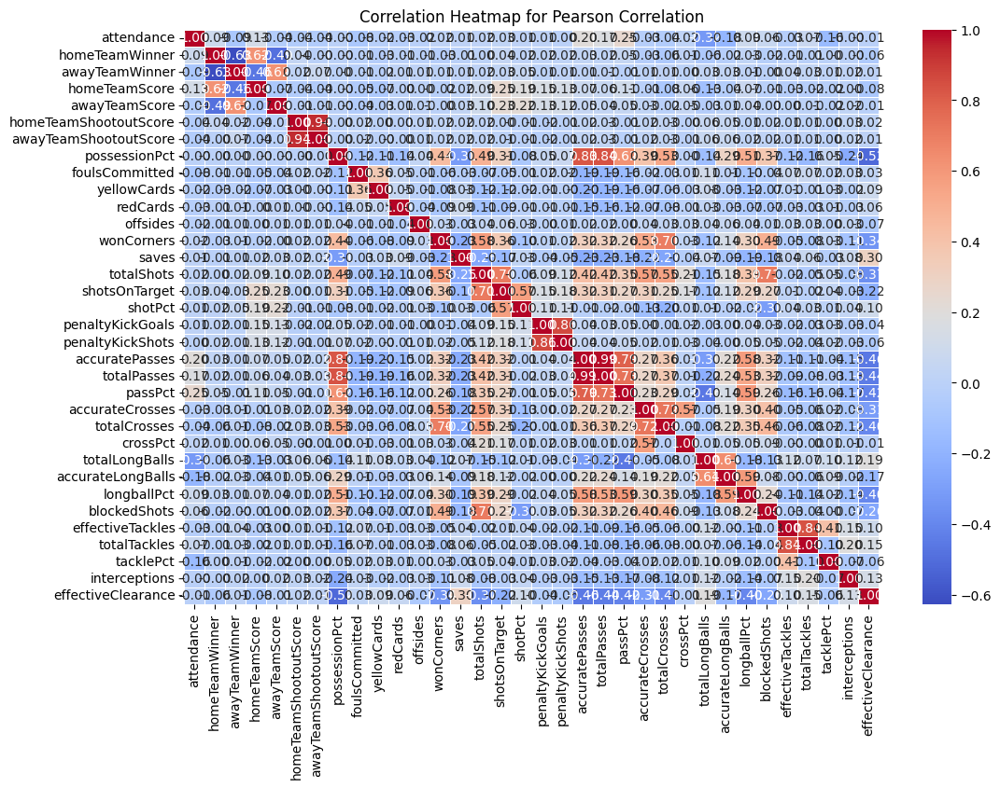

Correlation Matrix for Kendall:
                       attendance  homeTeamWinner  awayTeamWinner  homeTeamScore  awayTeamScore  homeTeamShootoutScore  awayTeamShootoutScore  possessionPct  foulsCommitted  yellowCards  redCards  offsides  wonCorners     saves  totalShots  shotsOnTarget   shotPct  penaltyKickGoals  penaltyKickShots  accuratePasses  totalPasses   passPct  accurateCrosses  totalCrosses  crossPct  totalLongBalls  accurateLongBalls  longballPct  blockedShots  effectiveTackles  totalTackles  tacklePct  interceptions  effectiveClearance
attendance               1.000000        0.058497       -0.061796       0.091233      -0.013967              -0.060715              -0.064770      -0.000067       -0.048931    -0.011543 -0.021863 -0.015014    0.015197  0.007676    0.014440       0.023799  0.010417         -0.003726         -0.006648        0.142228     0.118703  0.211612        -0.014198     -0.031157  0.012813       -0.232184          -0.133842     0.061197      0.046359     

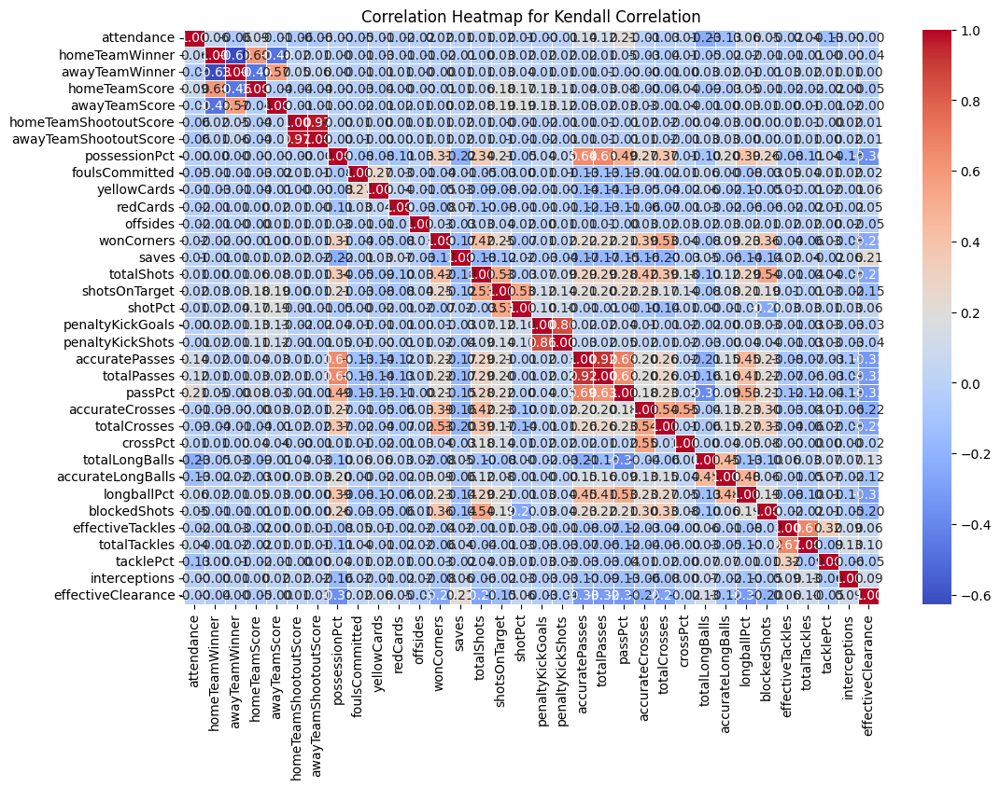

Correlation Matrix for Spearman:
                       attendance  homeTeamWinner  awayTeamWinner  homeTeamScore  awayTeamScore  homeTeamShootoutScore  awayTeamShootoutScore  possessionPct  foulsCommitted  yellowCards  redCards  offsides  wonCorners     saves  totalShots  shotsOnTarget   shotPct  penaltyKickGoals  penaltyKickShots  accuratePasses  totalPasses   passPct  accurateCrosses  totalCrosses  crossPct  totalLongBalls  accurateLongBalls  longballPct  blockedShots  effectiveTackles  totalTackles  tacklePct  interceptions  effectiveClearance
attendance               1.000000        0.071324       -0.075346       0.122336      -0.018328              -0.074297              -0.079243      -0.000100       -0.070561    -0.015816 -0.026753 -0.020471    0.021496  0.010570    0.020920       0.033350  0.014261         -0.004544         -0.008140        0.208685     0.174335  0.270893        -0.020023     -0.045423  0.017289       -0.337498          -0.194821     0.082065      0.064879    

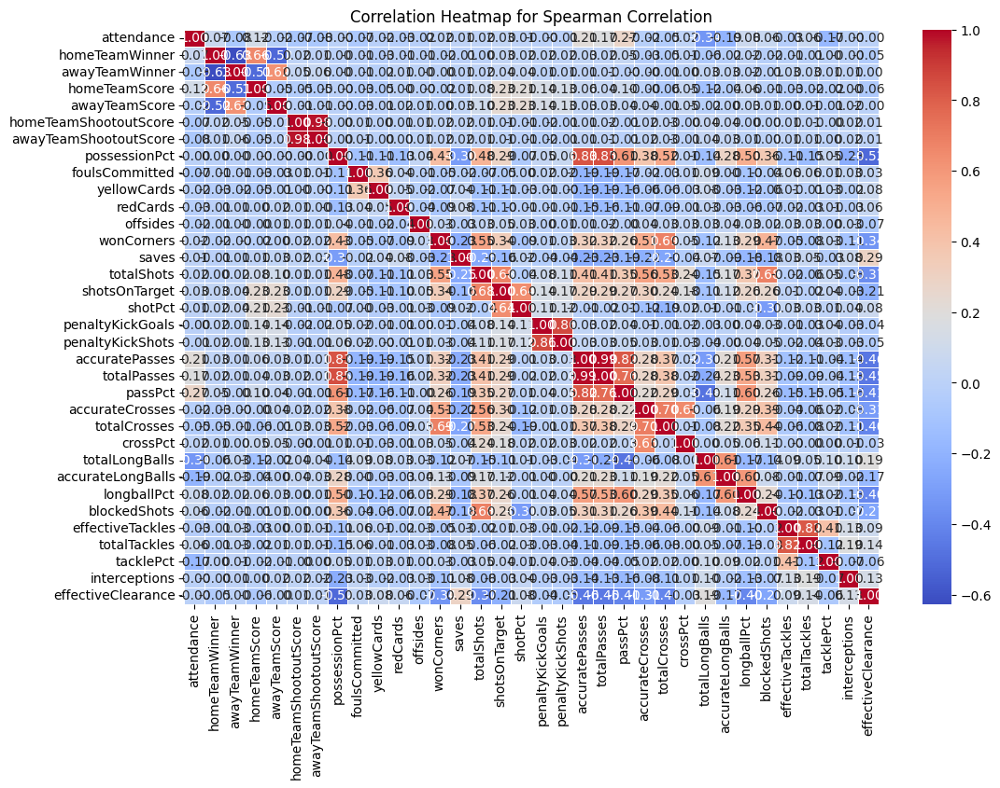

In [24]:
#correlation calc


# Calculate correlation matrices for each method: Pearson, Kendall, Spearman
correlation_results = {}

# Calculate correlation matrices for each method
for method in ['pearson', 'kendall', 'spearman']:
    correlation_results[method] = df[numerical_cols].corr(method=method)
    print(f"Correlation Matrix for {method.capitalize()}:")
    print(correlation_results[method])
    print("\n" + "-"*50 + "\n")  # Separator for readability

    # Generate heatmap for each correlation matrix
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlation_results[method], annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title(f"Correlation Heatmap for {method.capitalize()} Correlation")
    plt.show()

In [25]:
#summary only strong corelation per the Pearson, Kendall, Spearman which close to per threshold - enoghu for one of them to reach the threshold
#understand from this correaltion what want to present in the plots

# Function to summarize correlations, avoiding duplicate pairs
def summarize_correlations(correlation_results, threshold=0.75):
    summary = {
        'Linear Positive': [],
        'Linear Negative': [],
        'Positive Monotonic': [],
        'Negative Monotonic': []
    }

    # Create a set to track already processed pairs to avoid duplicates
    processed_pairs = set()

    # Loop through each correlation matrix
    for method, corr_matrix in correlation_results.items():
        for col1 in corr_matrix.columns:
            for col2 in corr_matrix.columns:
                if col1 != col2:
                    # Sort the column names to handle both (col1, col2) and (col2, col1) as duplicates
                    pair = tuple(sorted([col1, col2]))

                    if pair in processed_pairs:
                        continue  # Skip if the pair has already been processed

                    # Mark this pair as processed
                    processed_pairs.add(pair)

                    # Get the correlation values for the different methods
                    pearson_corr = correlation_results['pearson'].loc[col1, col2]
                    kendall_corr = correlation_results['kendall'].loc[col1, col2]
                    spearman_corr = correlation_results['spearman'].loc[col1, col2]

                    # Determine linear relationships from Pearson
                    if pearson_corr > threshold:  # Linear Positive relationship
                        summary['Linear Positive'].append((col1, col2, pearson_corr, 'pearson'))
                    elif pearson_corr < -threshold:  # Linear Negative relationship
                        summary['Linear Negative'].append((col1, col2, pearson_corr, 'pearson'))

                    # Determine monotonic relationships from Kendall and Spearman
                    if kendall_corr > threshold or spearman_corr > threshold:  # Positive Monotonic relationship
                        # Choose the highest correlation value and method
                        highest_corr = max((kendall_corr, 'kendall'), (spearman_corr, 'spearman'), key=lambda x: x[0])
                        summary['Positive Monotonic'].append((col1, col2, kendall_corr, spearman_corr, highest_corr[1]))
                    elif kendall_corr < -threshold or spearman_corr < -threshold:  # Negative Monotonic relationship
                        # Choose the highest (most negative) correlation value and method
                        highest_corr = max((kendall_corr, 'kendall'), (spearman_corr, 'spearman'), key=lambda x: abs(x[0]))
                        summary['Negative Monotonic'].append((col1, col2, kendall_corr, spearman_corr, highest_corr[1]))

    return summary


# Threshold
threshold_value = 0.75

# Get the summary of correlations with the given threshold
correlation_summary = summarize_correlations(correlation_results, threshold=threshold_value)

# Print the summary for each category
for category, relationships in correlation_summary.items():
    print(f"{category}:")
    for relationship in relationships:
        if category == 'Linear Positive' or category == 'Linear Negative':
            # Print only Pearson-related correlations
            print(f"  - {relationship[0]} vs {relationship[1]}: {relationship[2]:.2f} (Method: {relationship[3]})")
        else:
            # Print Kendall and Spearman correlations with the highest method mentioned
            print(f"  - {relationship[0]} vs {relationship[1]}: Kendall: {relationship[2]:.2f}, Spearman: {relationship[3]:.2f} (Method: {relationship[4]})")
    print("-" * 50)

Linear Positive:
  - homeTeamShootoutScore vs awayTeamShootoutScore: 0.94 (Method: pearson)
  - possessionPct vs accuratePasses: 0.83 (Method: pearson)
  - possessionPct vs totalPasses: 0.84 (Method: pearson)
  - penaltyKickGoals vs penaltyKickShots: 0.86 (Method: pearson)
  - accuratePasses vs totalPasses: 0.99 (Method: pearson)
  - accuratePasses vs passPct: 0.79 (Method: pearson)
  - effectiveTackles vs totalTackles: 0.84 (Method: pearson)
--------------------------------------------------
Linear Negative:
--------------------------------------------------
Positive Monotonic:
  - homeTeamShootoutScore vs awayTeamShootoutScore: Kendall: 0.97, Spearman: 0.98 (Method: spearman)
  - possessionPct vs accuratePasses: Kendall: 0.64, Spearman: 0.83 (Method: spearman)
  - possessionPct vs totalPasses: Kendall: 0.66, Spearman: 0.85 (Method: spearman)
  - penaltyKickGoals vs penaltyKickShots: Kendall: 0.86, Spearman: 0.86 (Method: spearman)
  - accuratePasses vs totalPasses: Kendall: 0.92, Spe

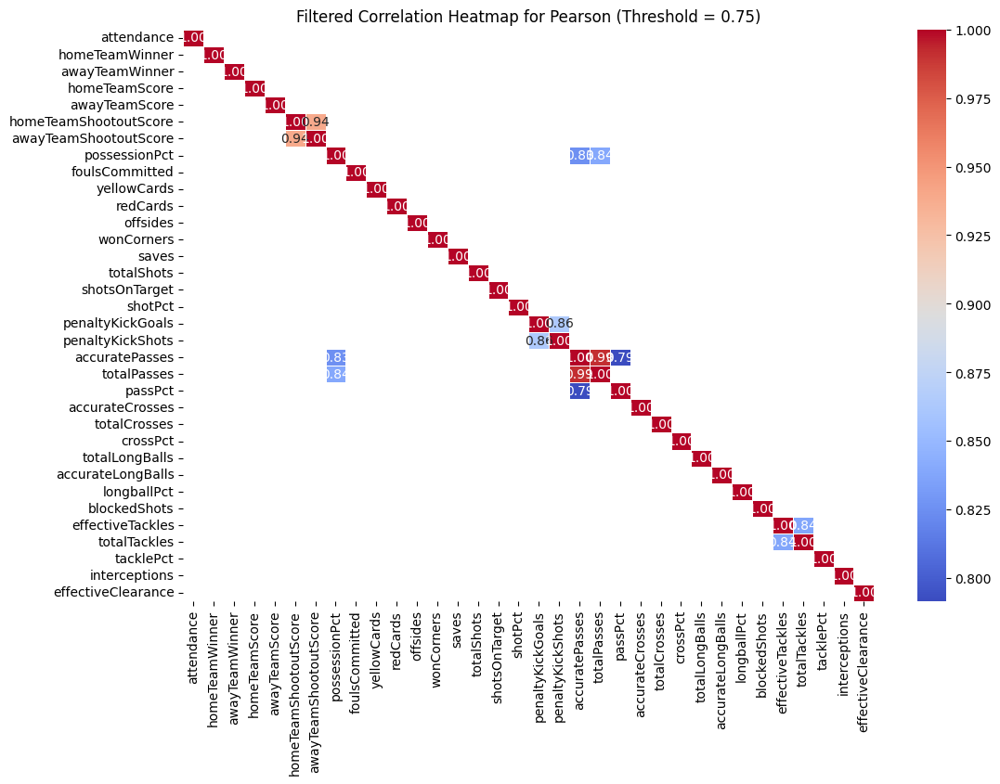

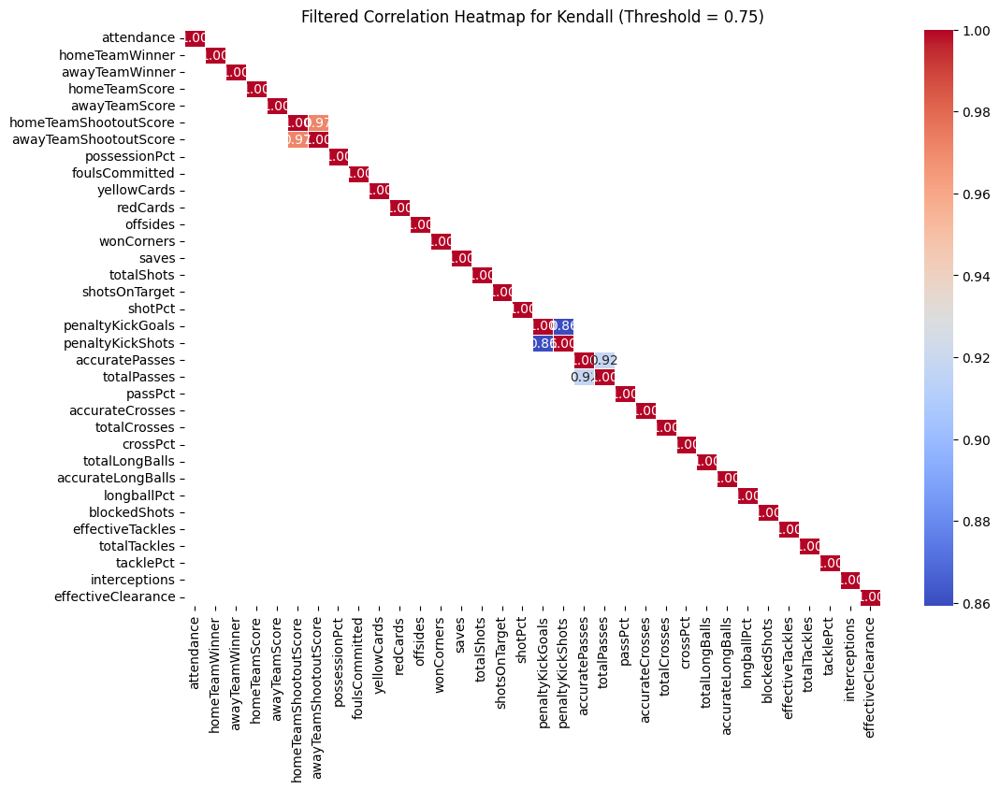

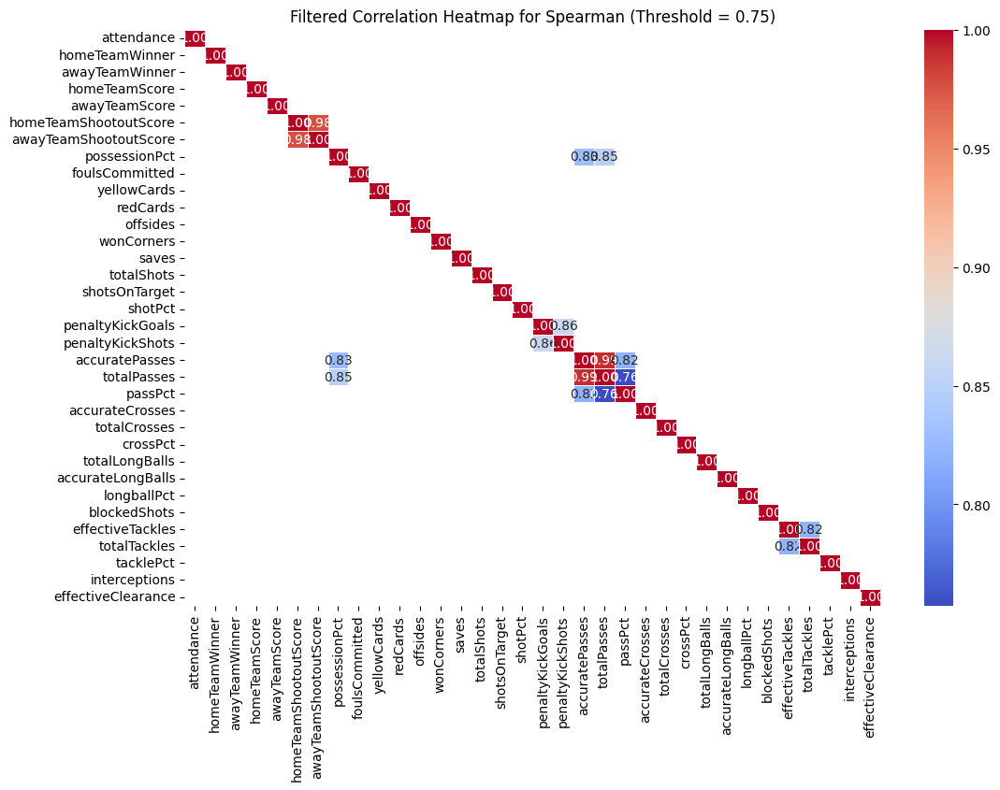

In [26]:
# show graph only the threshold for each Calculate correlation matrices for each method: Pearson, Kendall, Spearman
correlation_results = {}

# Calculate correlation matrices for each method
for method in ['pearson', 'kendall', 'spearman']:
    # Compute correlation matrix for the current method
    corr_matrix = df_final[numerical_cols].corr(method=method)
    correlation_results[method] = corr_matrix

    # Filter the correlation matrix by threshold value
    filtered_corr_matrix = corr_matrix.abs() > threshold_value  # Select correlations above the threshold
    filtered_corr_matrix = corr_matrix[filtered_corr_matrix]  # Keep only values above threshold
    filtered_corr_matrix = filtered_corr_matrix.dropna(axis=0, how='all').dropna(axis=1, how='all')  # Remove rows and columns with all NaN values

    # Generate heatmap for the filtered correlation matrix
    if not filtered_corr_matrix.empty:  # Only generate heatmap if there are correlations above the threshold
        plt.figure(figsize=(12, 8))
        sns.heatmap(filtered_corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
        plt.title(f"Filtered Correlation Heatmap for {method.capitalize()} (Threshold = {threshold_value})")
        plt.show()

In [27]:
#Skew and Kurtosis - if normal distribution and what the skew -dispo them prior to graph

# Ensure only numeric columns are included, explicitly checking data types
numerical_cols_clean = df.select_dtypes(include=['number']).columns

# Explicitly convert all relevant columns to numeric, coercing errors to NaN
df[numerical_cols_clean] = df[numerical_cols_clean].apply(pd.to_numeric, errors='coerce')

# Handle potential NaN values and compute skewness and kurtosis only for valid numerical columns - got this before the NaN and NULL handle before - left to not break the code
# Calculate skewness and round to 2 decimal places
skewness_df = df[numerical_cols_clean].apply(lambda x: round(skew(x.dropna()), 2) if len(x.dropna()) > 1 else None)
# Calculate kurtosis and round to 2 decimal places
kurtosis_df = df[numerical_cols_clean].apply(lambda x: round(kurtosis(x.dropna()), 2) if len(x.dropna()) > 1 else None)

# Determine if data is normally distributed based on skewness and kurtosis:
# Ensure that skewness and kurtosis are properly matched by column names
normality_df = pd.Series(index=skewness_df.index)

for col in skewness_df.index:
    # Apply the condition for "Normal" based on skewness, kurtosis, and the new conditions
    if (abs(skewness_df[col]) <= 0.75 and 2.25 <= kurtosis_df[col] <= 3.75) or (2.70 <= kurtosis_df[col] <= 3.3) :
        normality_df[col] = 'Normal'
    else:
        normality_df[col] = 'Not Normal'


# Classify skewness as Left, Right, or Normal based on the value of skewness
skew_type_df = skewness_df.apply(lambda x: 'Normal Skew' if abs(x) <= 0.5 else ('Right Skew' if x > 0 else 'Left Skew'))

# Combine all metrics into a single DataFrame
skew_kurtosis_df = pd.DataFrame({
    'Skewness': skewness_df,
    'Kurtosis': kurtosis_df,
    'Normality': normality_df,
    'Skew Type': skew_type_df
})

# Display the results
skew_kurtosis_df

C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\1051522828.py:24: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Not Normal' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  normality_df[col] = 'Not Normal'


,Skewness,Kurtosis,Normality,Skew Type
attendance,1.34,3.34,Not Normal,Right Skew
homeTeamWinner,0.13,-1.98,Not Normal,Normal Skew
awayTeamWinner,0.83,-1.32,Not Normal,Right Skew
homeTeamScore,1.05,1.52,Not Normal,Right Skew
awayTeamScore,1.20,1.83,Not Normal,Right Skew
homeTeamShootoutScore,10.08,138.71,Not Normal,Right Skew
awayTeamShootoutScore,9.85,126.43,Not Normal,Right Skew
possessionPct,0.00,-0.39,Not Normal,Normal Skew
foulsCommitted,0.36,0.17,Not Normal,Normal Skew
yellowCards,0.62,0.37,Not Normal,Right Skew


all distribution isnt Normal and have skew
because all non normal distribution - cant use pearson and will use only kandell and spearman strong correlation found
will need to see more graphs


Positive correlation for not normal:
  - homeTeamShootoutScore vs awayTeamShootoutScore: Kendall: 0.97, Spearman: 0.98 (Method: spearman)
  - possessionPct vs accuratePasses: Kendall: 0.64, Spearman: 0.83 (Method: spearman)
  - possessionPct vs totalPasses: Kendall: 0.66, Spearman: 0.85 (Method: spearman)
  - penaltyKickGoals vs penaltyKickShots: Kendall: 0.86, Spearman: 0.86 (Method: spearman)
  - accuratePasses vs totalPasses: Kendall: 0.92, Spearman: 0.99 (Method: spearman)
  - accuratePasses vs passPct: Kendall: 0.69, Spearman: 0.82 (Method: spearman)
  - totalPasses vs passPct: Kendall: 0.63, Spearman: 0.76 (Method: spearman)
  - effectiveTackles vs totalTackles: Kendall: 0.67, Spearman: 0.82 (Method: spearman)

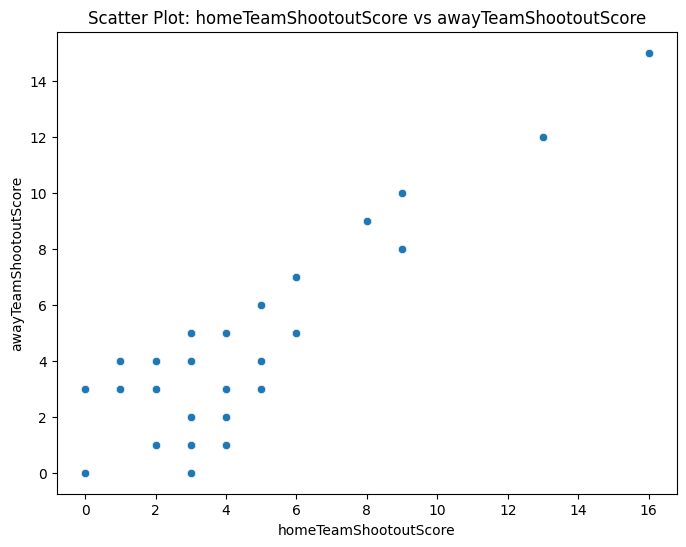

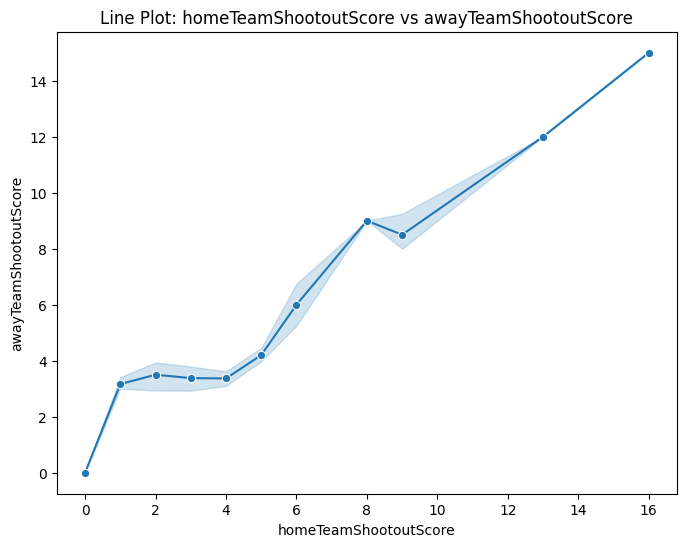

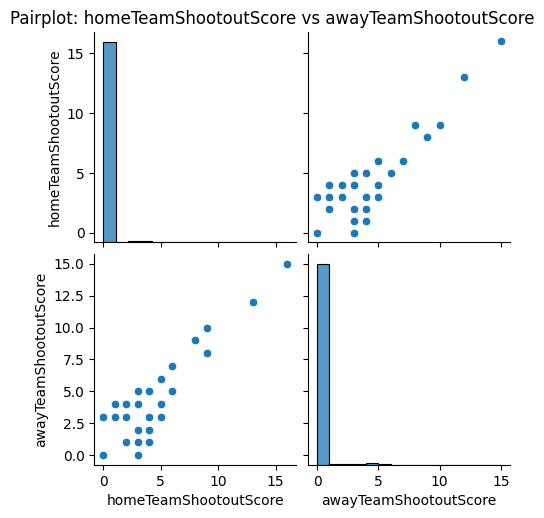

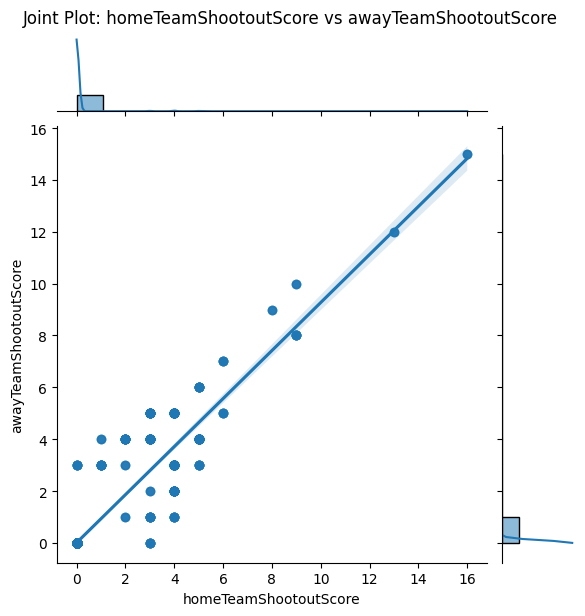

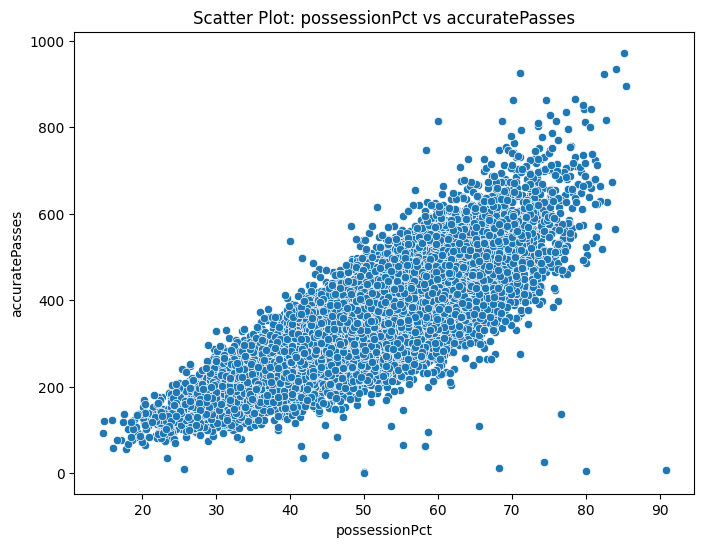

...

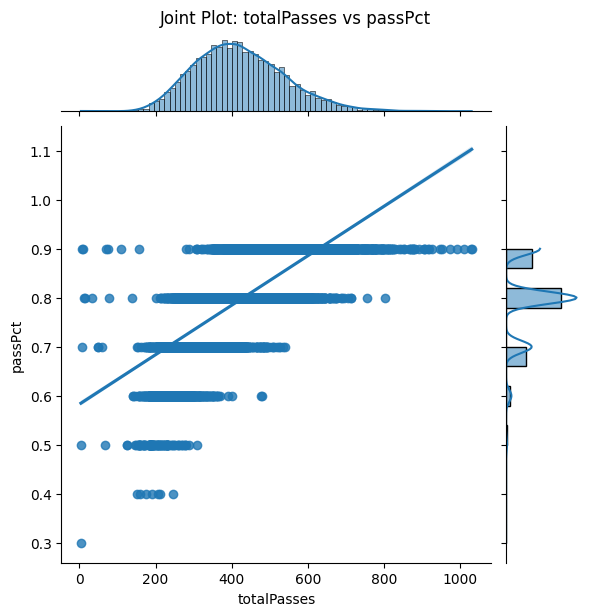

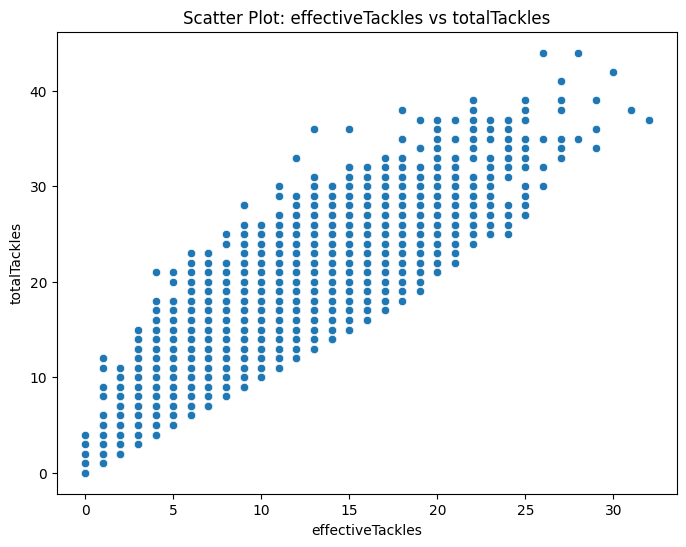

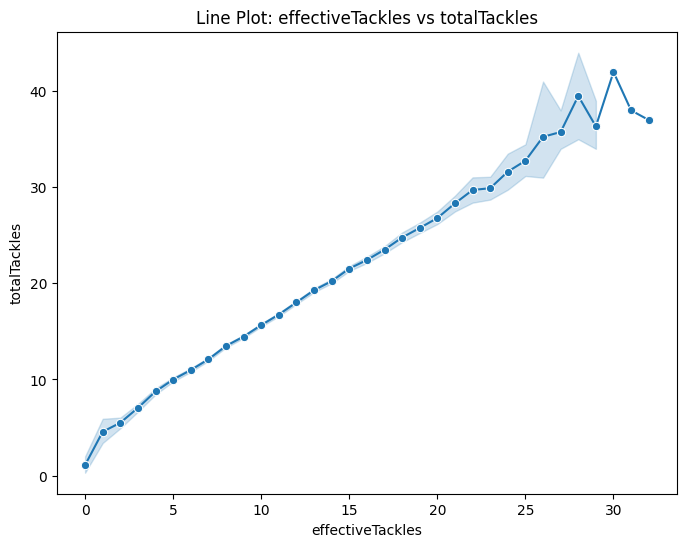

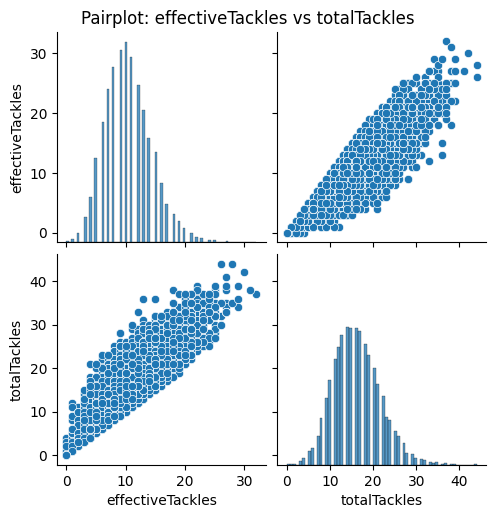

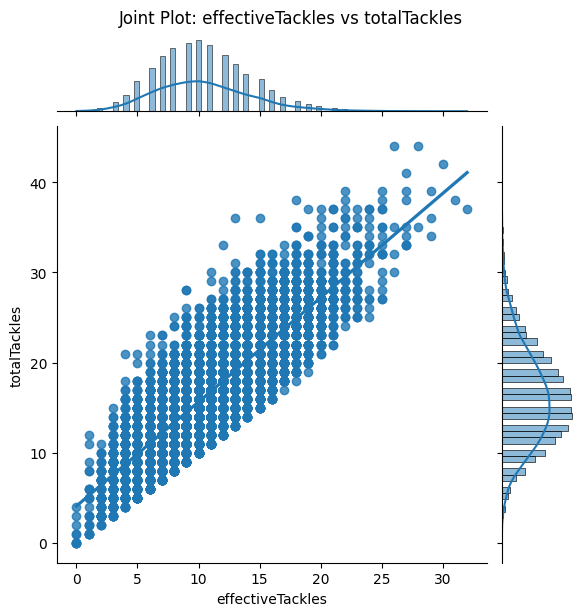

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pairs of variables with positive correlation
correlation_pairs = [
    ('homeTeamShootoutScore', 'awayTeamShootoutScore'),
    ('possessionPct', 'accuratePasses'),
    ('possessionPct', 'totalPasses'),
    ('penaltyKickGoals', 'penaltyKickShots'),
    ('accuratePasses', 'totalPasses'),
    ('accuratePasses', 'passPct'),
    ('totalPasses', 'passPct'),
    ('effectiveTackles', 'totalTackles')
]

# Loop through each pair of variables
for var1, var2 in correlation_pairs:
    # Scatter Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=var1, y=var2, data=df)
    plt.title(f"Scatter Plot: {var1} vs {var2}")
    plt.xlabel(var1)
    plt.ylabel(var2)
    plt.show()  # Show scatter plot
    
    # Line Plot
    plt.figure(figsize=(8, 6))
    sns.lineplot(x=var1, y=var2, data=df, marker="o")
    plt.title(f"Line Plot: {var1} vs {var2}")
    plt.xlabel(var1)
    plt.ylabel(var2)
    plt.show()  # Show line plot
    
    # Pairplot (shown as a separate figure)
    sns.pairplot(df[[var1, var2]])
    plt.suptitle(f"Pairplot: {var1} vs {var2}", y=1.02)
    plt.show()  # Show pairplot as a separate figure
    
    # Joint Plot (shown as a separate figure)
    sns.jointplot(x=var1, y=var2, data=df, kind="reg")
    plt.suptitle(f"Joint Plot: {var1} vs {var2}", y=1.02)
    plt.show()  # Show jointplot as a separate figure


  - homeTeamShootoutScore vs awayTeamShootoutScore: Kendall: 0.97, Spearman: 0.98 (Method: spearman) ->
	cant get any information from that
  - possessionPct vs accuratePasses: Kendall: 0.64, Spearman: 0.83 (Method: spearman) ->
	as far as your posseion is high you make more accurae passes
  - possessionPct vs totalPasses: Kendall: 0.66, Spearman: 0.85 (Method: spearman) ->
	same as previous as the parameter are alike
  - penaltyKickGoals vs penaltyKickShots: Kendall: 0.86, Spearman: 0.86 (Method: spearman) ->
	the parameter is very alike and cant relay on data from it they dependends
  - accuratePasses vs totalPasses: Kendall: 0.92, Spearman: 0.99 (Method: spearman) ->
	the parameter is very alike and cant relay on data from it they dependends
  - accuratePasses vs passPct: Kendall: 0.69, Spearman: 0.82 (Method: spearman) ->
	the parameter is very alike and cant relay on data from it they dependends
  - totalPasses vs passPct: Kendall: 0.63, Spearman: 0.76 (Method: spearman) ->
	the parameter is very alike and cant relay on data from it they dependends
  - effectiveTackles vs totalTackles: Kendall: 0.67, Spearman: 0.82 (Method: spearman) ->
	the parameter is very alike and cant relay on data from it they dependends

### General Insights Based on the Numerical Data Correlation:

From the correlation analysis, the primary takeaway is that **Ball Possession** is positively correlated with both **total pass count** and **accurate pass count**. Teams that have higher possession percentages tend to make more passes, and those passes are more likely to be accurate. This suggests that teams with better control of the ball generally exhibit higher passing success and volume.

However, aside from this observation, the data did not reveal significant correlations that would directly indicate factors influencing **win/loss outcomes**. Several features, such as **penalty kick goals** and **tackles**, showed high correlations with their related statistics (e.g., penalty kick shots, total tackles), but these parameters appear to be dependent on each other, limiting their ability to provide independent insights.

In conclusion, the most valuable insight from this analysis is the positive relationship between **possession** and **passing efficiency**, but no clear correlation was found between these factors and the match result (win or loss).


CATEGORY Correlation

Chi-Square p-value matrix:
                     status_name  teamOrder        season      day_type  homeTeamWinner_cat  awayTeamWinner_cat
status_name                  NaN   1.000000  1.760798e-25  2.215662e-17            0.100395        3.823091e-11
teamOrder           1.000000e+00        NaN  9.999958e-01  1.000000e+00            1.000000        1.000000e+00
season              1.760798e-25   0.999996           NaN  7.672967e-01            0.098512        2.330346e-01
day_type            2.215662e-17   1.000000  7.672967e-01           NaN            0.021992        2.735338e-05
homeTeamWinner_cat  1.003947e-01   1.000000  9.851217e-02  2.199222e-02                 NaN        0.000000e+00
awayTeamWinner_cat  3.823091e-11   1.000000  2.330346e-01  2.735338e-05            0.000000                 NaN


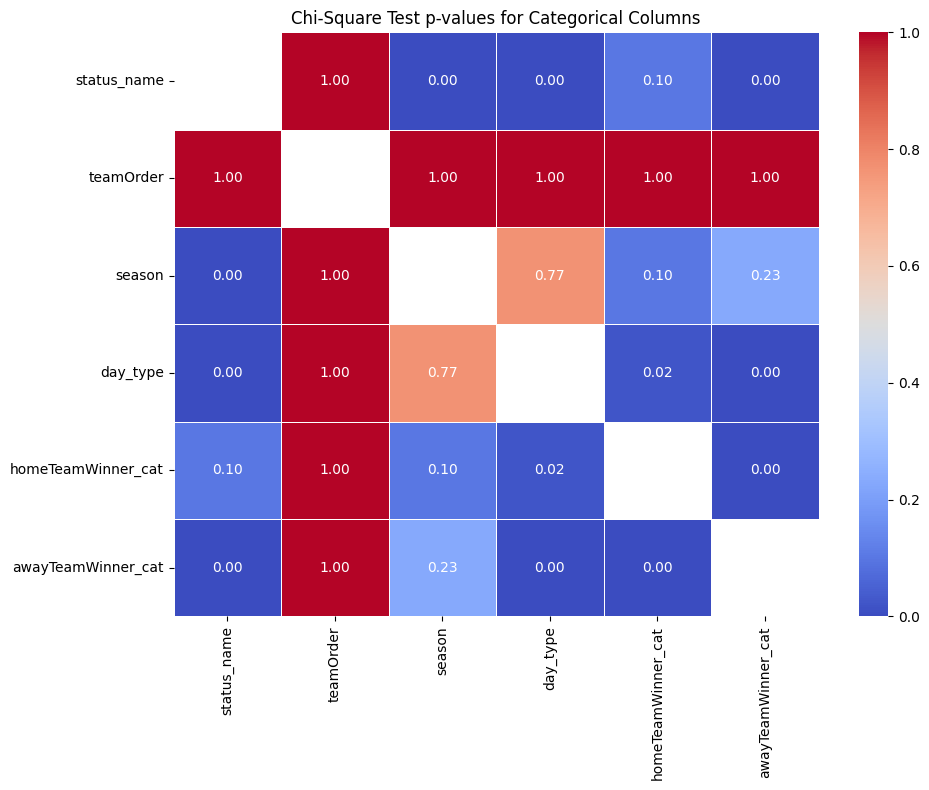

In [29]:
#correlation between the category column with chi-square

# Get all columns with dtype 'category'
categorical_columns = df.select_dtypes(include=['category']).columns.tolist()

# Create a DataFrame to store p-values of Chi-Square tests
p_value_matrix = pd.DataFrame(index=categorical_columns, columns=categorical_columns)

# Loop through each pair of categorical columns
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            # Perform the Chi-Square test of independence
            contingency_table = pd.crosstab(df[col1], df[col2])
            chi2_stat, p_value, dof, expected = stats.chi2_contingency(contingency_table)

            # Store the p-value in the p_value_matrix
            p_value_matrix.loc[col1, col2] = p_value

# Convert p-values to float for easier interpretation
p_value_matrix = p_value_matrix.astype(float)

# Display the p-value matrix
print("Chi-Square p-value matrix:")
print(p_value_matrix)

# Heatmap for the p-values (remove unnecessary plot generation for each pair)
plt.figure(figsize=(10, 8))
sns.heatmap(p_value_matrix, annot=True, cmap="coolwarm", fmt='.2f', linewidths=0.5)
plt.title("Chi-Square Test p-values for Categorical Columns")
plt.tight_layout()
plt.show()

can see that teamOrder have strong correlation to other categorail features
the teamOrder is Home/Away and its duplicate to all rows as for every game there is both home/away

no valid data can get from this correaltion between categories

Graphs

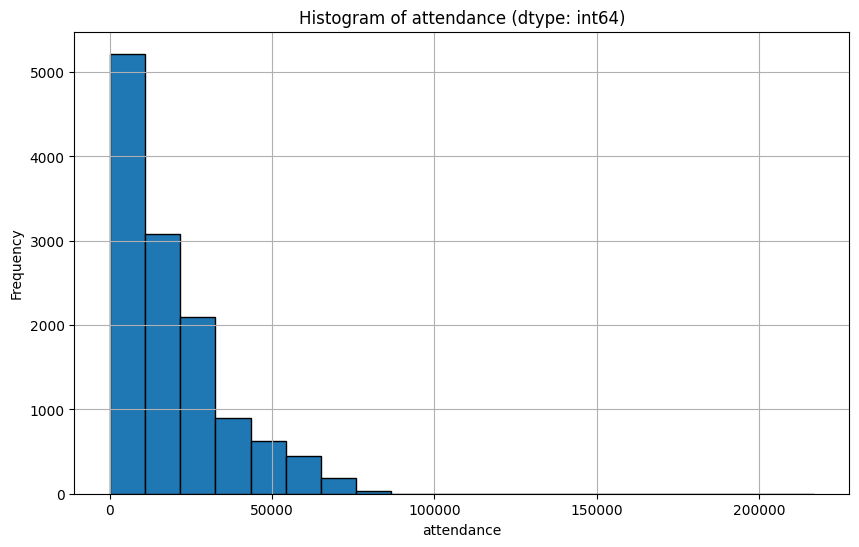

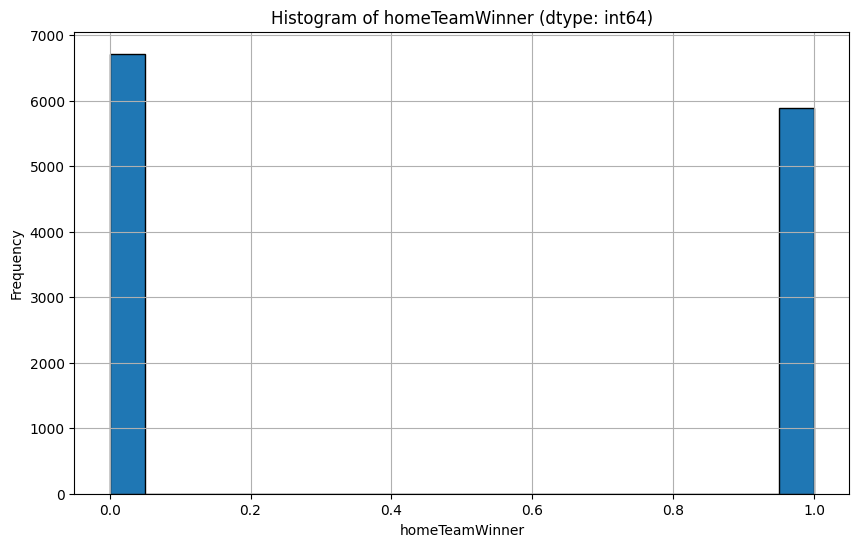

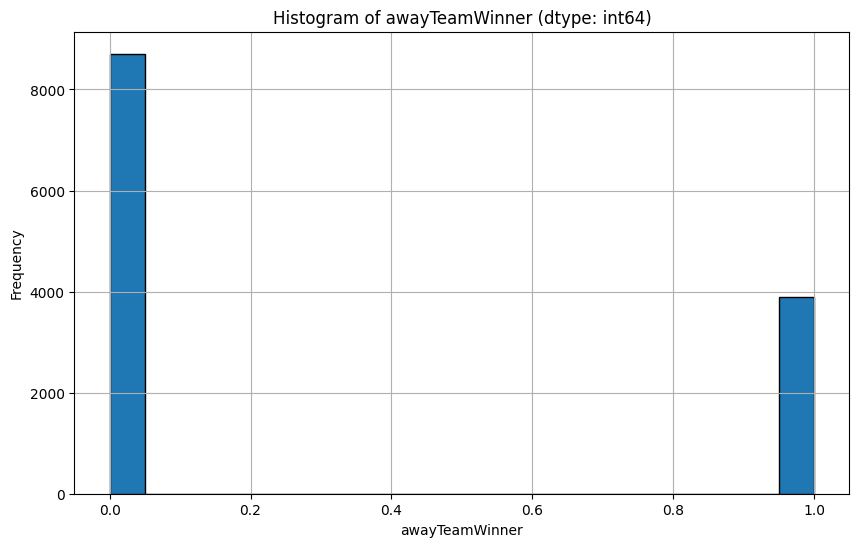

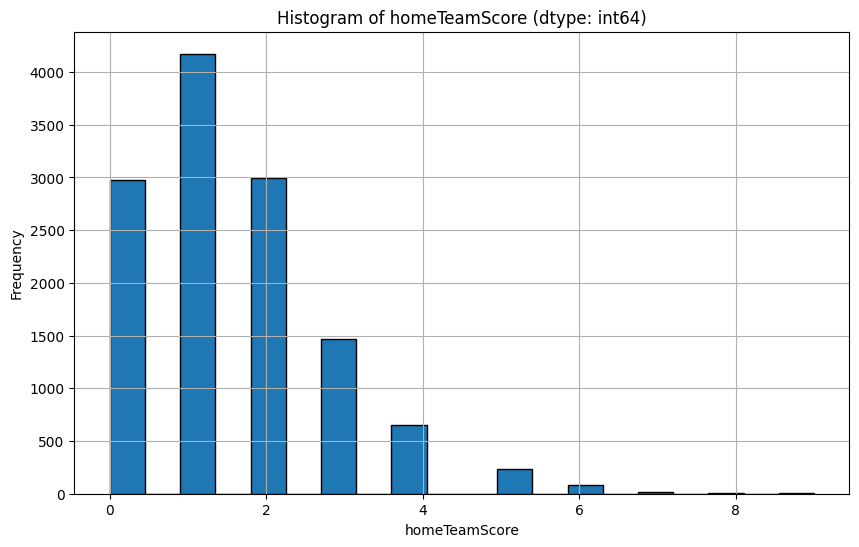

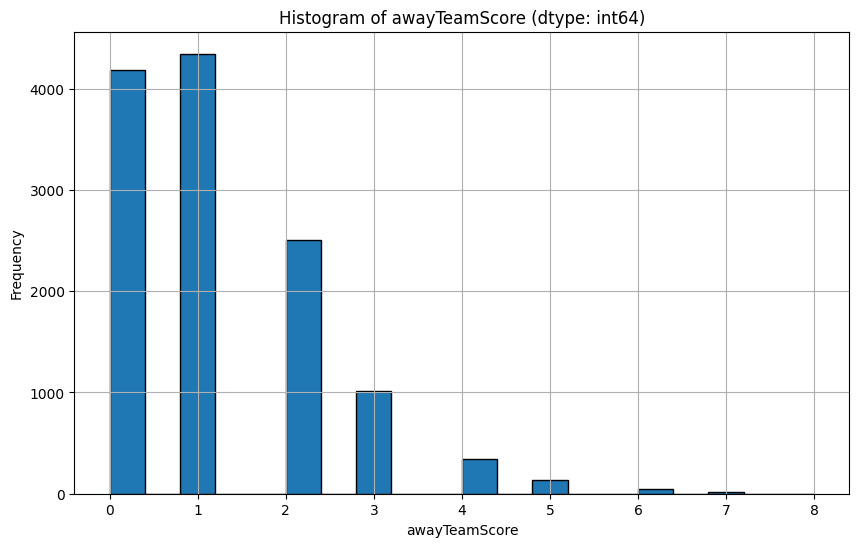

...

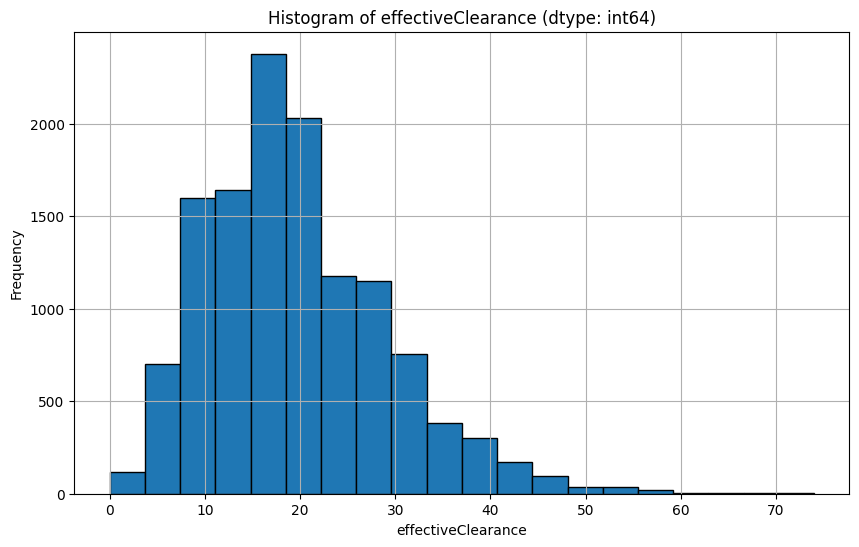

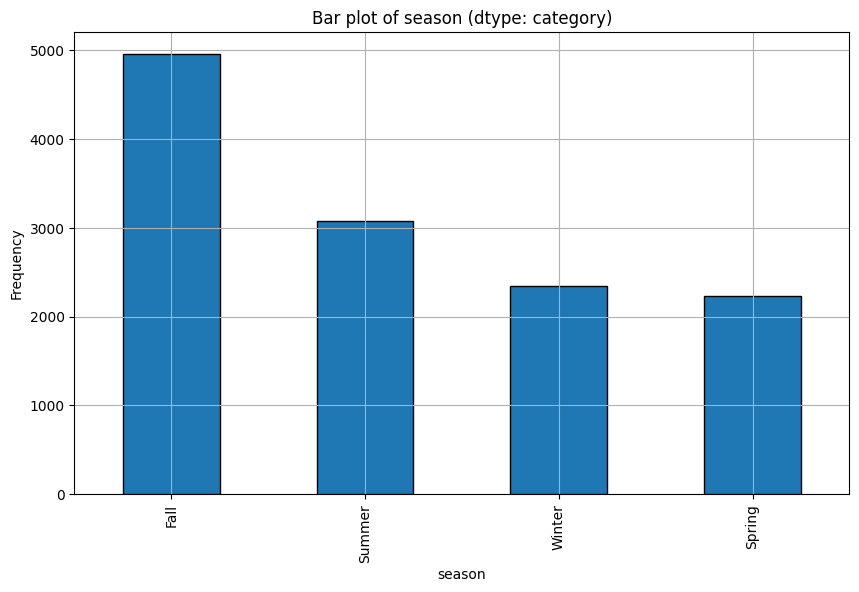

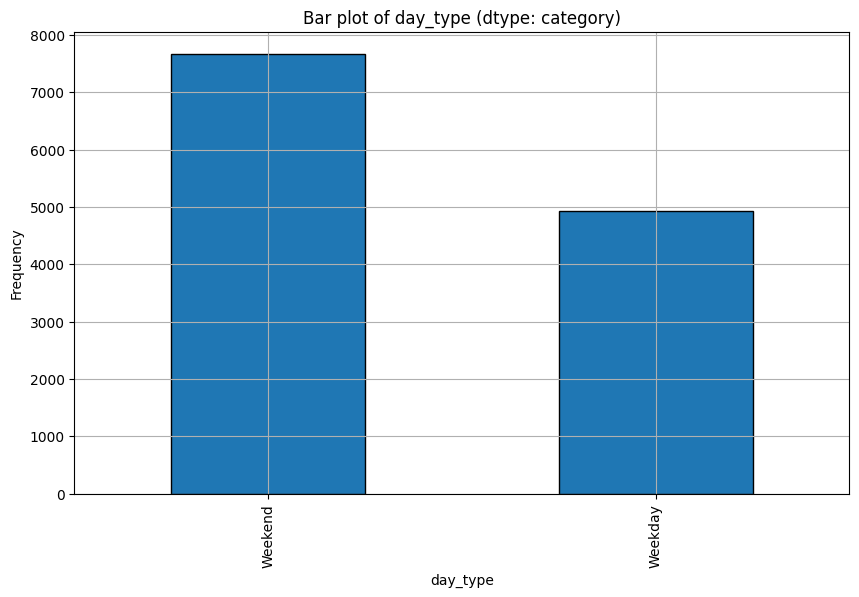

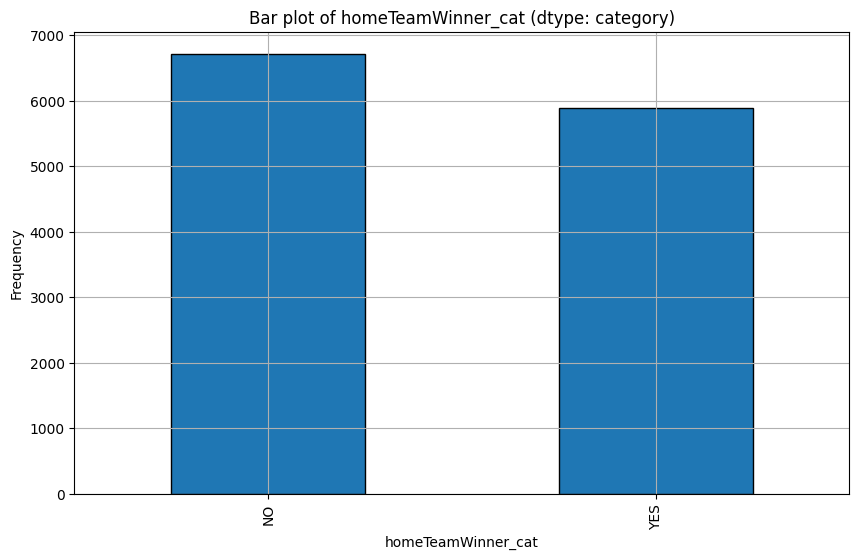

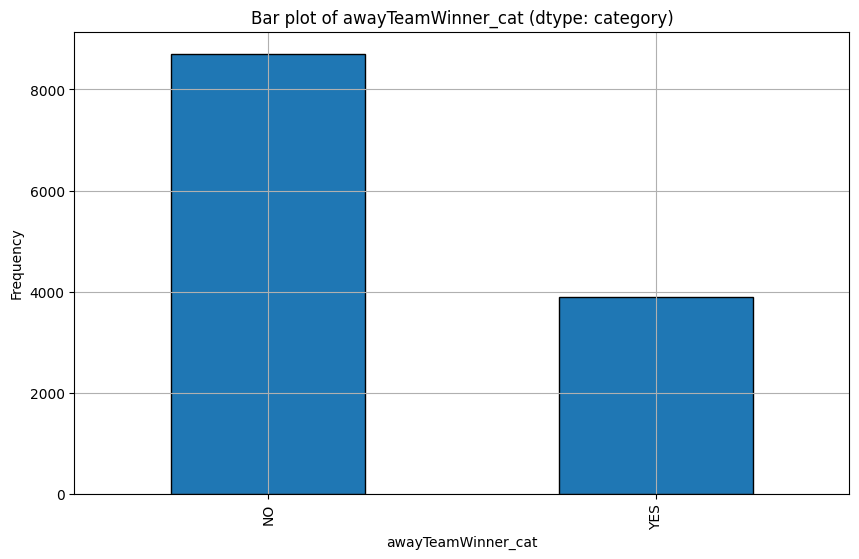

In [30]:
# Loop through all columns in the DataFrame for Histogram
for column in df.columns:
    # Get the dtype of the column
    column_dtype = df[column].dtype
    
    # Check if the column is numeric (float64 or int64)
    if column_dtype in ['float64', 'int64']:
        plt.figure(figsize=(10, 6))
        df[column].hist(bins=20, edgecolor='black')
        plt.title(f'Histogram of {column} (dtype: {column_dtype})')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()
    
    # Check if the column is categorical (category dtype or object dtype)
    elif column_dtype == 'category' or column_dtype == 'object':
        plt.figure(figsize=(10, 6))
        df[column].value_counts().plot(kind='bar', edgecolor='black')
        plt.title(f'Bar plot of {column} (dtype: {column_dtype})')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()
    
    # Check if the column is boolean
    elif column_dtype == 'bool':
        plt.figure(figsize=(10, 6))
        df[column].value_counts().plot(kind='bar', edgecolor='black')
        plt.title(f'Bar plot of {column} (dtype: {column_dtype})')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()


will try to do test by group to see if any category in thd DB can affect the features



In [31]:
# group by all categorial and perfrom statistic check if they are matched or not
#Noraml use T-Test for 2 gourps and levene more than 2 groups
#not normail use Mann whitney for 2 groups try Kruskal-Wallis Test or Friedman Test for more than 2 groups
#if they arent match than the category is suggnificent for the specific feature

# Get all columns with dtype 'category'
categorical_columns = df.select_dtypes(include='category').columns.tolist()

# Create a results DataFrame to store the test outcomes
test_results = []

# Significance level
alpha = 0.05

# Loop through each categorical column
for col in categorical_columns:
    # Group by the categorical column
    grouped = df.groupby(col)
    
    # Get all the numerical columns for testing
    numerical_cols = df.select_dtypes(include=['number']).columns
    
    # Perform statistical tests based on the feature type
    for numerical_col in numerical_cols:
        # Determine if the column is normally distributed
        is_normal = skew_kurtosis_df.loc[numerical_col, 'Normality'] == "Normal"
        
        # Get data for each group
        groups_data = [group[numerical_col].dropna() for _, group in grouped]
        
        # Initialize test results
        test_name = None
        test_statistic = None
        p_value = None
        result = None
        
        # Perform the relevant test depending on normality
        try:
            if is_normal:
                # If normally distributed, use T-Test and Levene Test
                if len(groups_data) == 2:  # T-Test only for two groups
                    test_name = "T-Test"
                    t_stat, t_p = ttest_ind(groups_data[0], groups_data[1], equal_var=False)
                    test_statistic, p_value = t_stat, t_p
                elif len(groups_data) > 1:  # Levene Test for variance equality
                    test_name = "Levene Test"
                    levene_stat, levene_p = levene(*groups_data)
                    test_statistic, p_value = levene_stat, levene_p
            else:
                # If not normally distributed, try Mann-Whitney U Test, Kruskal-Wallis Test, or Friedman Test
                if len(groups_data) == 2:  # Mann-Whitney U Test for two groups
                    test_name = "Mann-Whitney U Test"
                    try:
                        mannwhitney_stat, mannwhitney_p = mannwhitneyu(groups_data[0], groups_data[1])
                        test_statistic, p_value = mannwhitney_stat, mannwhitney_p
                    except Exception as e:
                        test_statistic, p_value = None, None
                        print(f"Error in Mann-Whitney U Test: {e}")
                
                elif len(groups_data) > 2:  # Kruskal-Wallis Test for more than two groups
                    test_name = "Kruskal-Wallis Test"
                    try:
                        kruskal_stat, kruskal_p = kruskal(*groups_data)
                        test_statistic, p_value = kruskal_stat, kruskal_p
                    except Exception as e:
                        test_statistic, p_value = None, None
                        print(f"Error in Kruskal-Wallis Test: {e}")

                    if p_value is None:
                        # If Kruskal-Wallis failed, try the Friedman Test
                        test_name = "Friedman Test"
                        try:
                            friedman_stat, friedman_p = friedmanchisquare(*groups_data)
                            test_statistic, p_value = friedman_stat, friedman_p
                        except Exception as e:
                            test_statistic, p_value = None, None
                            print(f"Error in Friedman Test: {e}")
            
            # Determine significance
            if p_value is not None:
                result = "Significant" if p_value < alpha else "Not Significant"
        
        except Exception as e:
            test_name = "Error"
            test_statistic, p_value, result = None, None, None
            print(f"General Error: {e}")
        
        # Store results for this column and numerical column
        test_results.append({
            'Categorical Column': col,
            'Numerical Column': numerical_col,
            'Normality': 'Normal' if is_normal else 'Non-Normal',
            'Test Used': test_name,
            'Test Statistic': test_statistic,
            'P-Value': p_value,
            'Result': result
        })

# Convert the results into a DataFrame for easy viewing
test_results_df = pd.DataFrame(test_results)

# Display the first 5 and last 5 rows of the DataFrame
#display(test_results_df.head(), test_results_df.tail())

display(test_results_df)


C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\2857590400.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(col)
C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\2857590400.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(col)
C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\2857590400.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df

,Categorical Column,Numerical Column,Normality,Test Used,Test Statistic,P-Value,Result
0,status_name,attendance,Non-Normal,Kruskal-Wallis Test,1.033503e+02,3.612181e-23,Significant
1,status_name,homeTeamWinner,Non-Normal,Kruskal-Wallis Test,4.596926e+00,1.004131e-01,Not Significant
2,status_name,awayTeamWinner,Non-Normal,Kruskal-Wallis Test,4.797095e+01,3.830374e-11,Significant
3,status_name,homeTeamScore,Non-Normal,Kruskal-Wallis Test,3.909418e+01,3.241953e-09,Significant
4,status_name,awayTeamScore,Non-Normal,Kruskal-Wallis Test,3.721106e+01,8.312288e-09,Significant
5,status_name,homeTeamShootoutScore,Non-Normal,Kruskal-Wallis Test,1.230680e+04,0.000000e+00,Significant
6,status_name,awayTeamShootoutScore,Non-Normal,Kruskal-Wallis Test,1.230676e+04,0.000000e+00,Significant
7,status_name,possessionPct,Non-Normal,Kruskal-Wallis Test,2.727375e-05,9.999864e-01,Not Significant
8,status_name,foulsCommitted,Non-Normal,Kruskal-Wallis Test,6.592441e+01,4.838337e-15,Significant
9,status_name,yellowCards,Non-Normal,Kruskal-Wallis Test,3.036724e+01,2.545878e-07,Significant


In [32]:
#check if there is significent group that if group by we get 2 seperate populaiton for all featuers

# Filter test_results_df to find categories where all tests are significant
significant_categories = test_results_df.groupby('Categorical Column').filter(
    lambda x: (x['Result'] == 'Significant').all()
)

# Extract the unique categorical column names that passed the significance check
significant_category_names = significant_categories['Categorical Column'].unique()

# Display the filtered categories
print("Categories where all tests are significant:")
print(significant_category_names)


Categories where all tests are significant:
[]


No group that affect all feature

In [33]:
#all feature that the category dose impact the statistics and which test used 

# Filter test_results_df to only include significant results
significant_results = test_results_df[test_results_df['Result'] == 'Significant']

# Group by numerical column (feature) and aggregate categories and tests used
features_with_significance = significant_results.groupby('Numerical Column').agg(
    significant_categories=('Categorical Column', lambda x: list(x.unique())),
    tests_used=('Test Used', lambda x: list(x.unique())),
    normality=('Normality', lambda x: list(x.unique()))  # Add Normality column
).reset_index()

# Display the results
display(features_with_significance)


,Numerical Column,significant_categories,tests_used,normality
0,accurateCrosses,"[status_name, teamOrder, season, day_type, homeTeamWinner_cat]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]
1,accurateLongBalls,"[status_name, teamOrder, season, homeTeamWinner_cat, awayTeamWinner_cat]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]
2,accuratePasses,"[status_name, teamOrder, season, homeTeamWinner_cat]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]
3,attendance,"[status_name, season, day_type, homeTeamWinner_cat, awayTeamWinner_cat]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]
4,awayTeamScore,"[status_name, season, homeTeamWinner_cat, awayTeamWinner_cat]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]
5,awayTeamShootoutScore,"[status_name, season, day_type, awayTeamWinner_cat]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]
6,awayTeamWinner,"[status_name, day_type, homeTeamWinner_cat, awayTeamWinner_cat]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]
7,blockedShots,"[status_name, teamOrder, season]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]
8,crossPct,"[teamOrder, season]","[Mann-Whitney U Test, Kruskal-Wallis Test]",[Non-Normal]
9,effectiveClearance,"[status_name, teamOrder, season, day_type, homeTeamWinner_cat]","[Kruskal-Wallis Test, Mann-Whitney U Test]",[Non-Normal]


got list of features that got affected by the bygroup and which groups
becaue there is no correaltion between the groups, i will take only featues that have 1-2 groups by and not all
focus on Mann-Whitney U Test which test not normal between 2 groups which i want to test

homeTeamWinner_cat
awayTeamWinner_cat
day_type
teamOrder

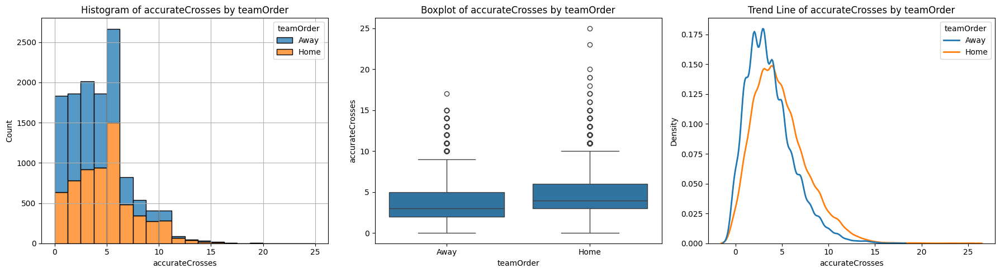

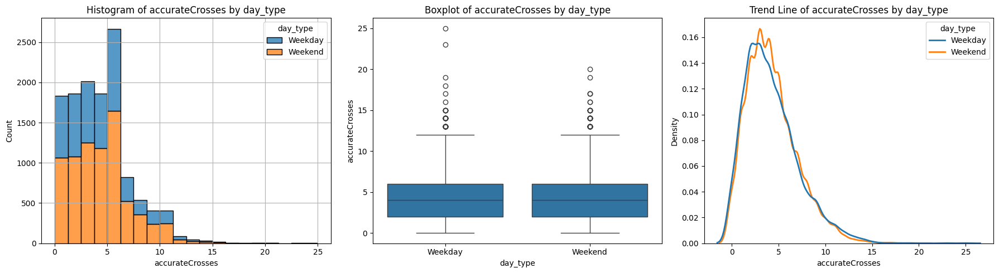

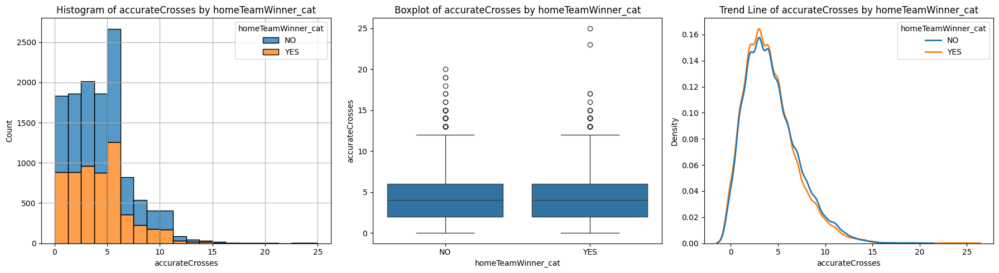

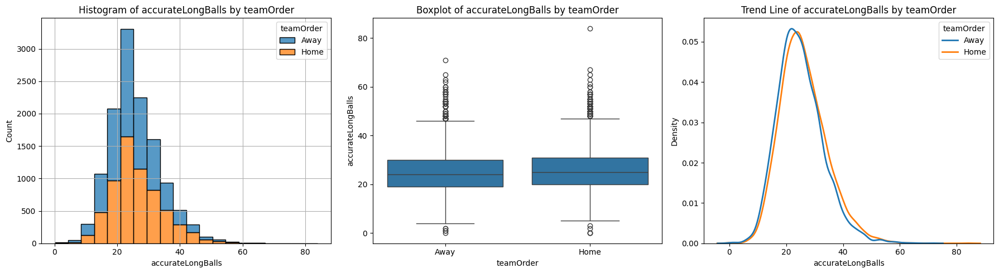

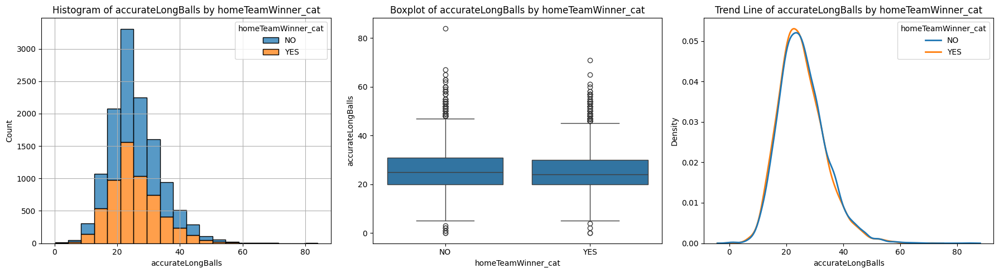

...

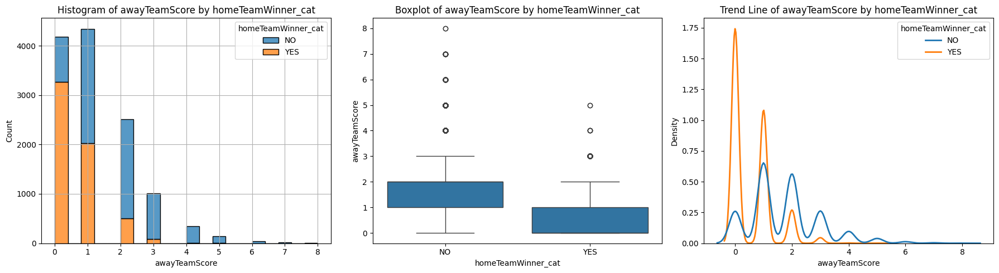

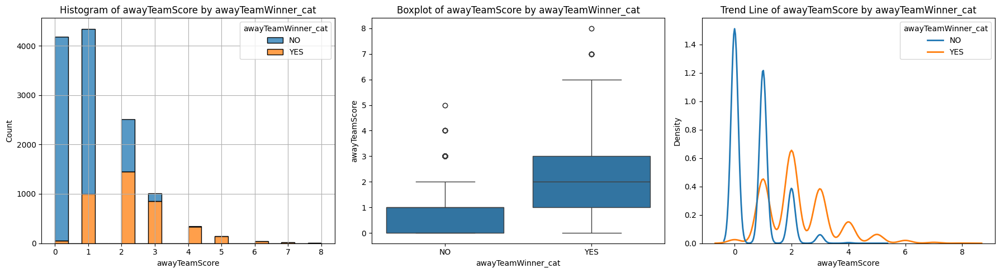

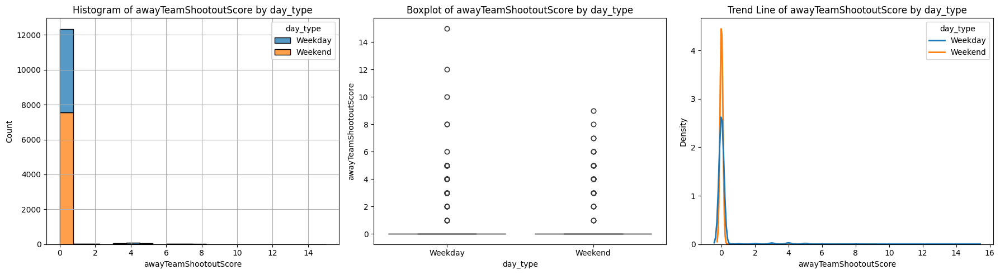

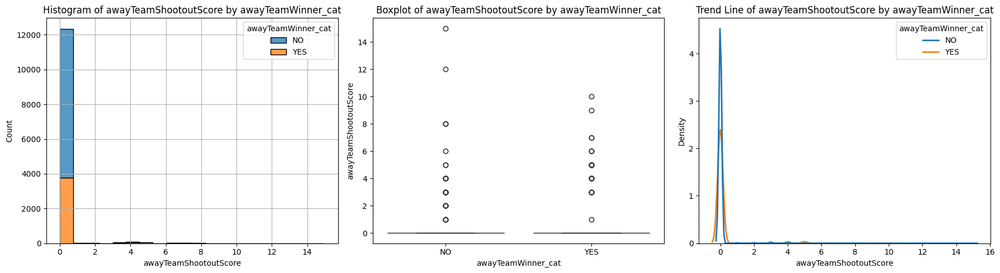

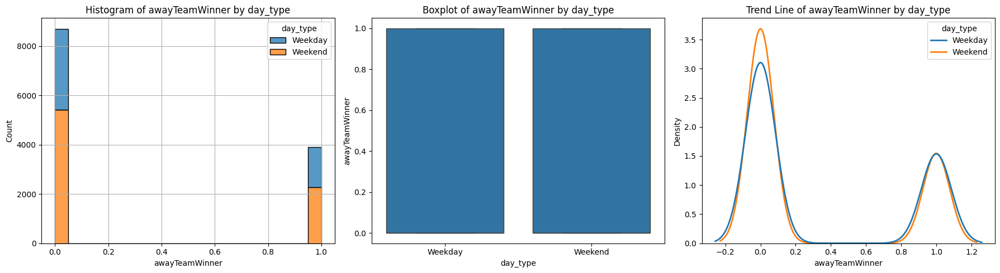

C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\362118850.py:43: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=numerical_column, hue=cat, common_norm=False, fill=False, linewidth=2, ax=ax[2])


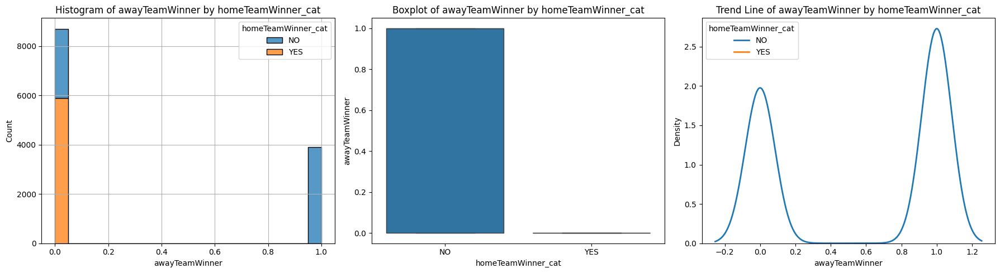

C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\362118850.py:43: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=numerical_column, hue=cat, common_norm=False, fill=False, linewidth=2, ax=ax[2])


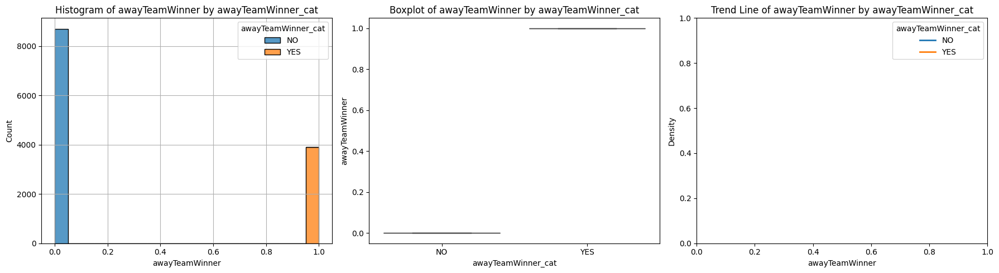

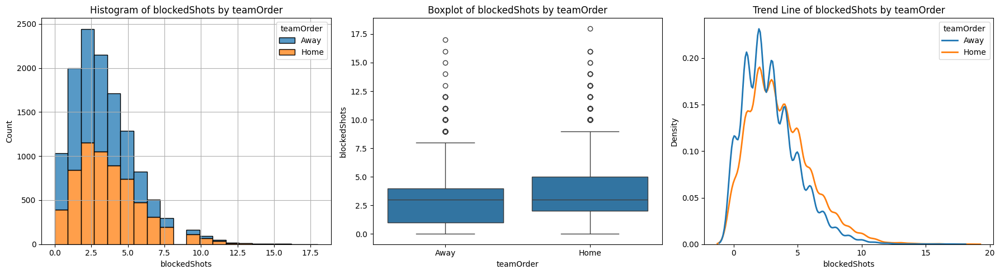

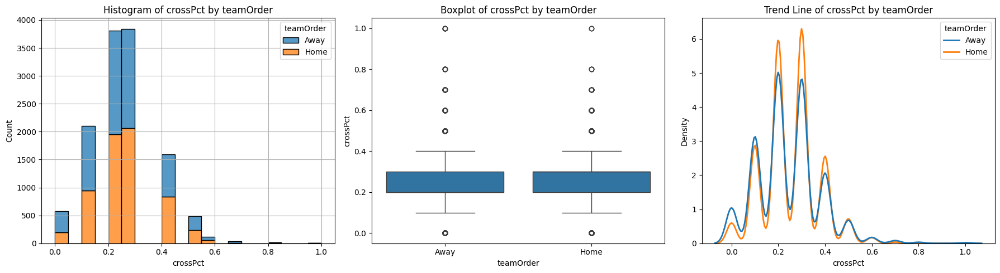

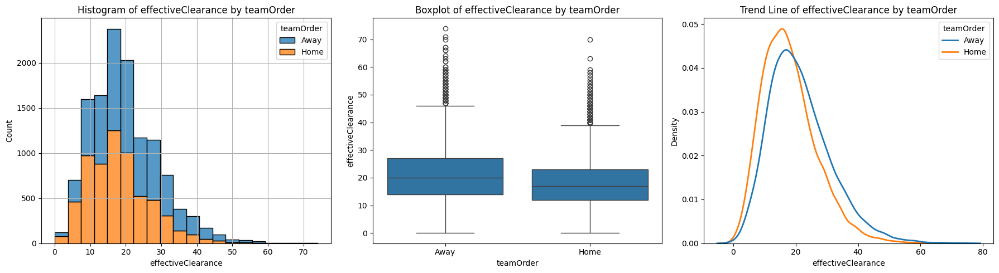

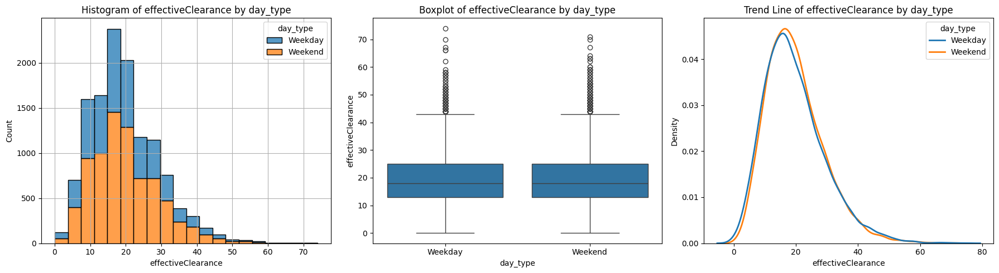

...

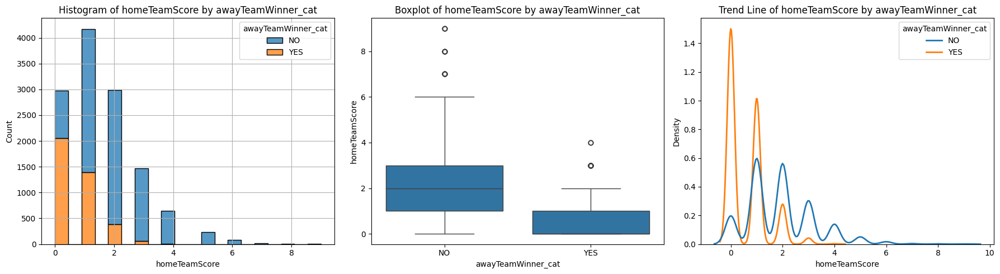

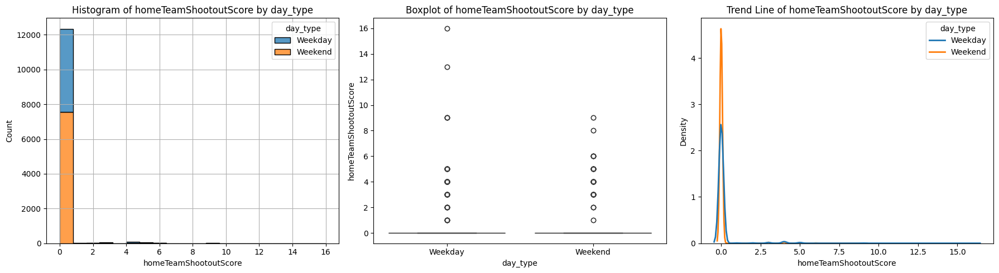

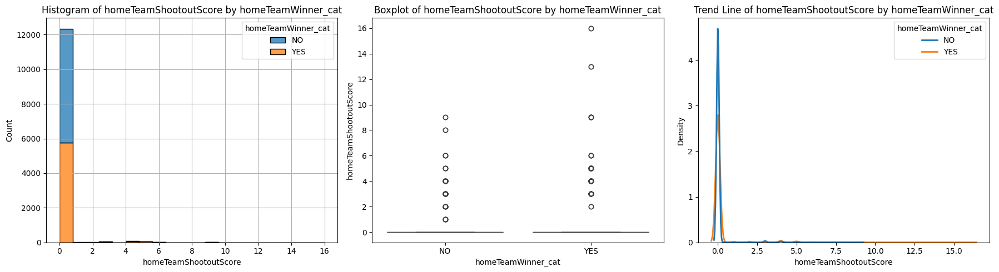

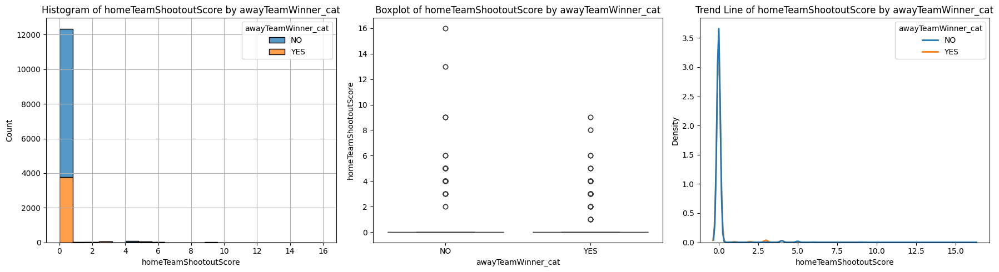

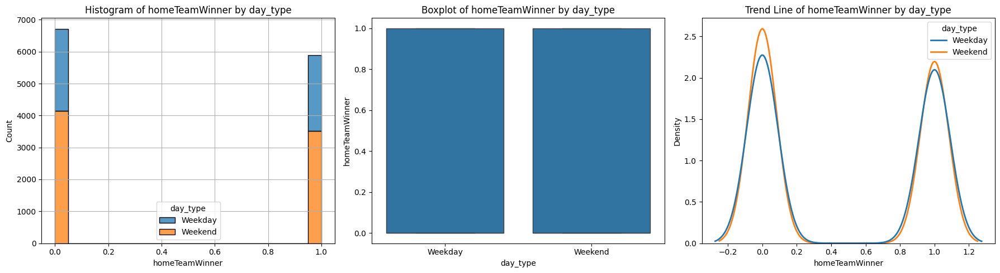

C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\362118850.py:43: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=numerical_column, hue=cat, common_norm=False, fill=False, linewidth=2, ax=ax[2])


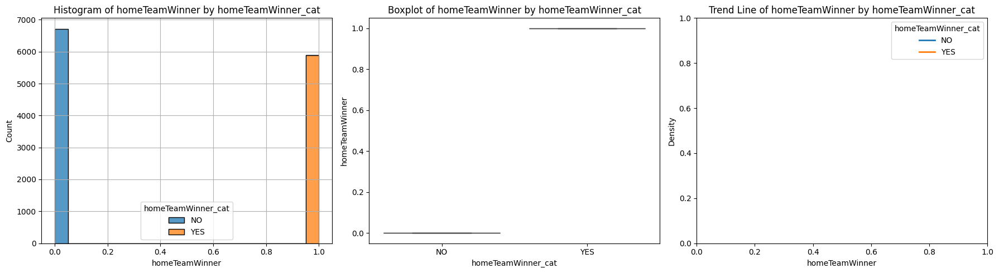

C:\Users\Aviv Israeli\AppData\Local\Temp\ipykernel_2492\362118850.py:43: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=numerical_column, hue=cat, common_norm=False, fill=False, linewidth=2, ax=ax[2])


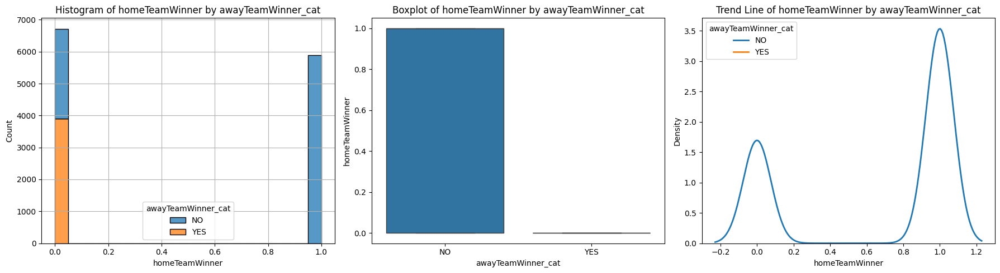

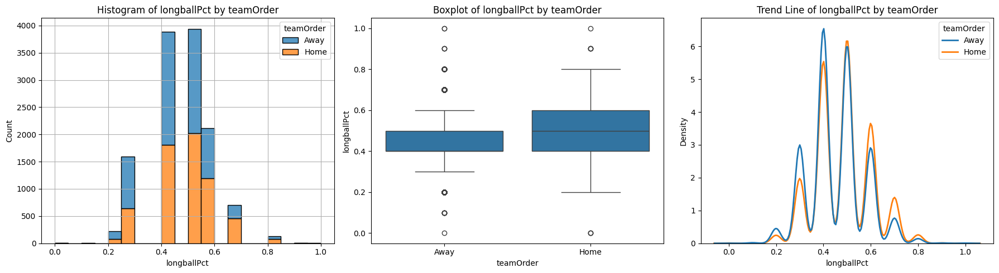

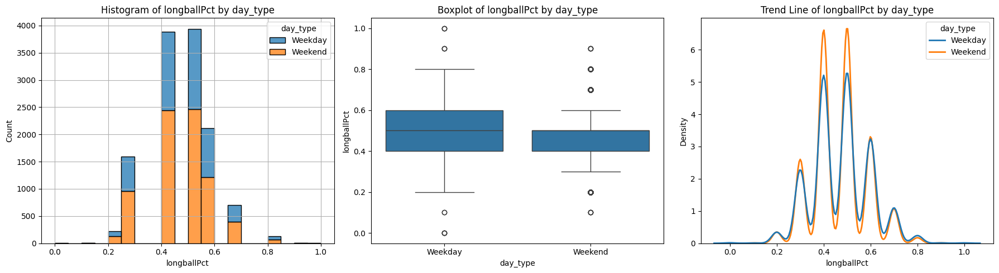

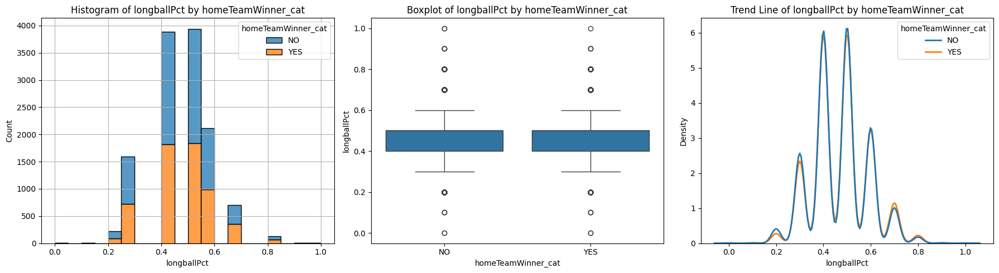

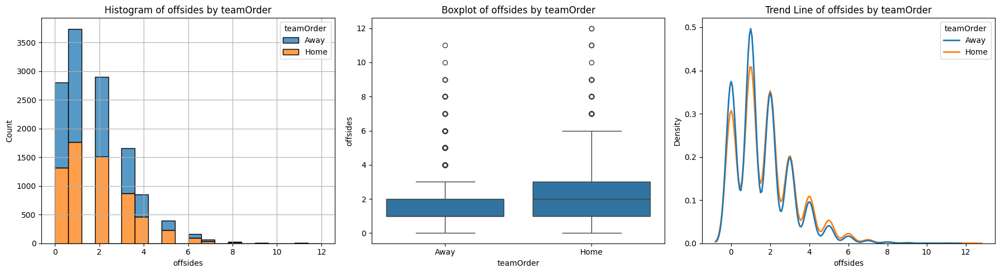

...

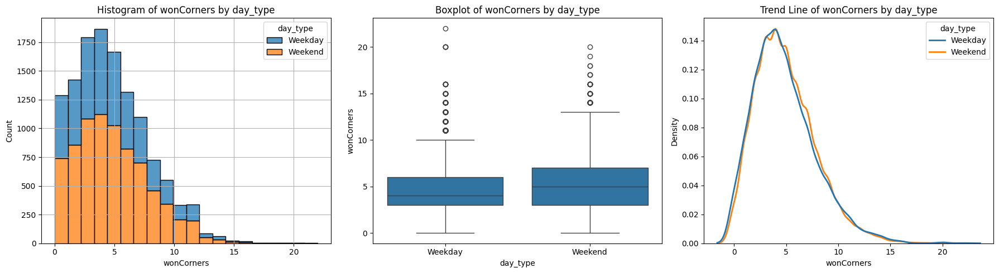

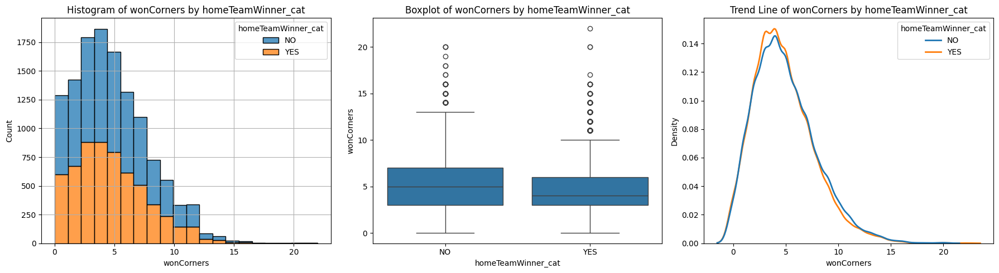

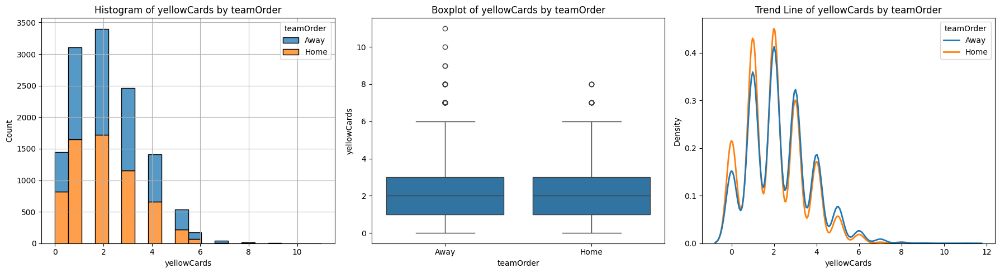

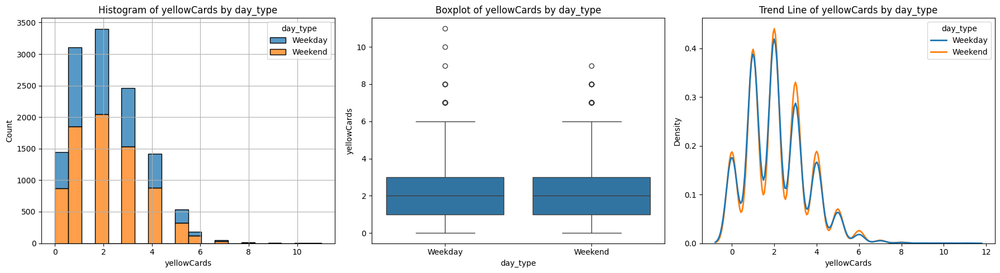

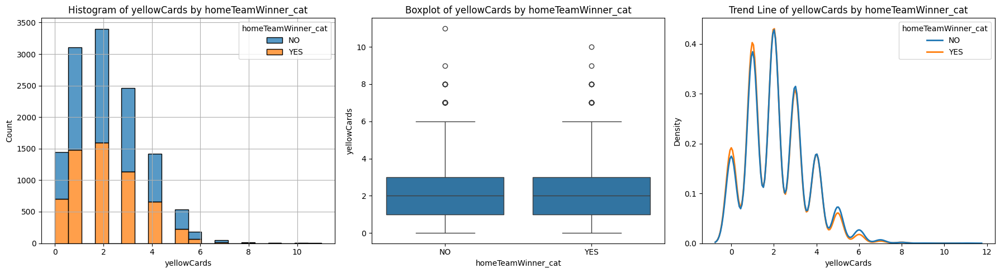

In [34]:
# List of significant categories to consider
significant_categories_of_interest = ['homeTeamWinner_cat', 'awayTeamWinner_cat', 'day_type', 'teamOrder']

# Filter rows where the significant categories include any of the specified categories
filtered_features = features_with_significance[features_with_significance['significant_categories'].apply(
    lambda x: any(cat in significant_categories_of_interest for cat in x))
]

# Number of numerical columns and categories to plot
numerical_columns = filtered_features['Numerical Column'].tolist()

# Loop through each numerical column
for numerical_column in numerical_columns:
    # Filter out the significant categories that are not in the significant_categories_of_interest list
    significant_categories = [
        cat for cat in features_with_significance[features_with_significance['Numerical Column'] == numerical_column]['significant_categories'].values[0]
        if cat in significant_categories_of_interest
    ]
    
    # Create a new figure for each numerical column
    for cat in significant_categories:
        fig, ax = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots: histogram, boxplot, KDE

        # Left subplot: Stacked Histogram
        sns.histplot(data=df, x=numerical_column, hue=cat, kde=False, bins=20, edgecolor='black', stat='count',
                     common_norm=False, multiple='stack', ax=ax[0])

        # Set the title and labels for the histogram
        ax[0].set_title(f'Histogram of {numerical_column} by {cat}')
        ax[0].set_ylabel('Count')
        ax[0].set_xlabel(numerical_column)
        ax[0].grid(True)

        # Middle subplot: Box Plot
        sns.boxplot(data=df, x=cat, y=numerical_column, ax=ax[1])

        # Set the title and labels for the box plot
        ax[1].set_title(f'Boxplot of {numerical_column} by {cat}')
        ax[1].set_ylabel(numerical_column)
        ax[1].set_xlabel(cat)

        # Right subplot: Trend Line (KDE)
        sns.kdeplot(data=df, x=numerical_column, hue=cat, common_norm=False, fill=False, linewidth=2, ax=ax[2])

        # Set the labels and title for KDE plot
        ax[2].set_ylabel('Density')
        ax[2].set_title(f'Trend Line of {numerical_column} by {cat}')

        # Adjust layout to prevent overlap
        plt.tight_layout()
        plt.show()  # Show the plots for each category


per charts below of the significent relations deviation found:

1. **accurateCrosses** -> Home team has more accurate crosses.  
2. **accurateLongBalls** -> Home team has slightly more accurate long balls.  
3. **accuratePasses** -> Home team has slightly more accurate passes.  
4. **attendance** -> On weekends, there is more attendance. Home team has a higher chance of winning, and the away team has a higher chance of losing.  
5. **blockedShots** -> Home team has more blocked shots.  
6. **effectiveClearance** -> Away team has more effective clearances, which slightly decreases the home team's chance of winning.  
7. **homeTeamWinner** -> Home team has less chance of winning on weekends.  
8. **longballPct** -> Home team has a higher long ball percentage, which is higher on weekdays.  
9. **offsides** -> Home team has more offsides.  
10. **passPct** -> Home team has a higher pass percentage, which increases their chance of winning.  
11. **possessionPct** -> Home team has higher possession percentage.  
12. **saves** -> Away team has more saves.  
13. **shotPct** -> Home team has steadier and more consistent shot accuracy; teams with higher shot percentages have a better chance of winning.  
14. **shotsOnTarget** -> Home team has a better chance of getting shots on target.  
15. **tacklePct** -> Home team has a higher chance of having more tackles.  
16. **totalCrosses** -> Fewer than ~25 crosses favor the home team to win, but more crosses increase the chance of losing.  
17. **totalPasses** -> Slightly higher for the home team.  
18. **totalShots** -> Home team has more total shots.  
19. **wonCorners** -> Home team has more corners, and there are more corners on weekends.  




### Insights from the Data

#### **General Team Performance Insights**
1. **Home Team Advantage:**
   - The home team consistently shows better performance in metrics such as accurate crosses, long balls, passes, possession percentage, and total shots.
   - The home team also tends to have more blocked shots, tackles, and corners.

2. **Away Team Performance:**
   - The away team tends to have more saves, indicating they are often under more pressure from the home team.

3. **Shooting Efficiency:**
   - Teams with higher shot percentages (accuracy) have a better chance of winning.
   - The home team has steadier and more consistent shooting accuracy compared to the away team.

#### **Game Characteristics**
4. **Weekend vs. Weekday Matches:**
   - Weekend matches see higher attendance.
   - The home team has a reduced chance of winning on weekends.
   - Long ball percentages are higher on weekdays.

5. **Crossing Behavior:**
   - Fewer total crosses (~25 or fewer) favor the home team to win. However, more crosses increase the chance of the home team losing.

6. **Offsides:**
   - The home team has more offsides, possibly indicating a more aggressive attacking strategy.

#### **Winning Factors**
7. **Pass Percentage:**
   - Higher pass percentages are linked to better chances of winning for the home team.

8. **Clearances:**
   - Higher clearance rates by the away team slightly reduce the home team’s chance of winning.

9. **Shooting on Target:**
   - The home team has a better chance of getting more shots on target, which increases their winning potential.

10. **Corner Kicks:**
    - The home team tends to win more corners. Additionally, more corners are observed on weekends.



### Hypotheses to Check and Validate:

1. **Is there a difference in statistics between categories, specifically?**
   - **Yes**, there are typically differences in statistics, often favoring the home team.

2. **What is the HOME/AWAY chance to WIN based on all statistics?**
   - The **home team** is more likely to win based on statistics, as they tend to achieve higher performance metrics.
   - However, **total crosses** is an exception. The home team needs to have fewer than approximately 25 crosses in order to increase their chances of winning.

3. **Does the attendance amount affect the stats for each home/away?**
   - The **home team** generally has a higher chance of winning with higher attendance, but this relationship becomes more complicated on weekends. Despite higher attendance on weekends, the home team’s chances of winning are **reduced**.
   - This could be due to the fact that attendance reflects general fan presence and is not team-specific. On weekends, the **away team** may be stronger, and their fans may be more likely to travel, leading to increased attendance. Additionally, it may be easier for away fans to attend weekend games compared to weekdays, when work commitments could limit travel. However, there is no available data to confirm this theory.

